In [1]:
# https://ithelp.ithome.com.tw/articles/10206894
# https://ithelp.ithome.com.tw/articles/10205113

# install pandas-datareader
# conda install pandas-datareader
# from pandas_datareader import data, wb 

# install ta-lib: https://www.lfd.uci.edu/~gohlke/pythonlibs/

import pandas_datareader as pdr
df_2330 = pdr.DataReader('2330.TW', 'yahoo')

In [2]:
df_2330['Close']

Date
2010-01-04     64.900002
2010-01-05     64.500000
2010-01-06     64.900002
2010-01-07     64.199997
2010-01-08     64.000000
2010-01-11     64.500000
2010-01-12     63.599998
2010-01-13     62.799999
2010-01-14     63.200001
2010-01-15     63.500000
2010-01-18     62.900002
2010-01-19     62.500000
2010-01-20     63.000000
2010-01-21     62.599998
2010-01-22     61.099998
2010-01-25     60.400002
2010-01-26     60.099998
2010-01-27     59.599998
2010-01-28     60.000000
2010-01-29     61.500000
2010-02-01     59.799999
2010-02-02     59.000000
2010-02-03     59.799999
2010-02-04     59.099998
2010-02-05     57.200001
2010-02-08     57.400002
2010-02-09     58.599998
2010-02-10     58.400002
2010-02-22     59.000000
2010-02-23     59.799999
                 ...    
2019-08-26    248.500000
2019-08-27    250.000000
2019-08-28    252.000000
2019-08-29    254.000000
2019-08-30    259.000000
2019-09-02    257.500000
2019-09-03    254.000000
2019-09-04    257.500000
2019-09-05    263.00

In [3]:
import numpy as np
np.array(df_2330['Close'])

array([ 64.90000153,  64.5       ,  64.90000153, ..., 278.        ,
       286.5       , 282.        ])

In [4]:
df_2330

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2010-01-04,65.000000,64.000000,65.000000,64.900002,39407000.0,45.411293
2010-01-05,65.099998,63.900002,65.000000,64.500000,37138000.0,45.131405
2010-01-06,64.900002,63.700001,64.500000,64.900002,49261000.0,45.411293
2010-01-07,65.000000,64.199997,64.900002,64.199997,42134000.0,44.921494
2010-01-08,64.300003,63.500000,63.500000,64.000000,46076000.0,44.781555
2010-01-11,64.900002,63.500000,64.000000,64.500000,36799000.0,45.131405
2010-01-12,64.400002,63.299999,64.400002,63.599998,49853000.0,44.501663
2010-01-13,63.099998,62.599998,63.000000,62.799999,47976000.0,43.941902
2010-01-14,63.599998,63.000000,63.599998,63.200001,36149000.0,44.221779


In [5]:
# install mpl_finance
# Open Anaconda Prompt and type: pip install mpl_finance

# install ta-lib
# Download specific version of ta-lib in https://www.lfd.uci.edu/~gohlke/pythonlibs/
# Open Anaconda Prompt and switch to the path of folder of downloaded ta-lib whl file
# and type: pip install TA_Lib-0.4.17-cp27-cp27m-win_amd64.whl
# the whl name should be replaced with the name of the fact that your downloaded whl file

'''
(base) D:\00-TerrenceProject\00-Python\PythonProgram>pip install TA_Lib-0.4.17-cp27-cp27m-win_amd64.whl
Processing d:\00-terrenceproject\00-python\pythonprogram\ta_lib-0.4.17-cp27-cp27m-win_amd64.whl
Installing collected packages: TA-Lib
Successfully installed TA-Lib-0.4.17
'''

# basic
import numpy as np
import pandas as pd

# get data
import pandas_datareader as pdr

# visual
import matplotlib.pyplot as plt
import mpl_finance as mpf
%matplotlib inline
import seaborn as sns

#time
import datetime as datetime

#talib
import talib

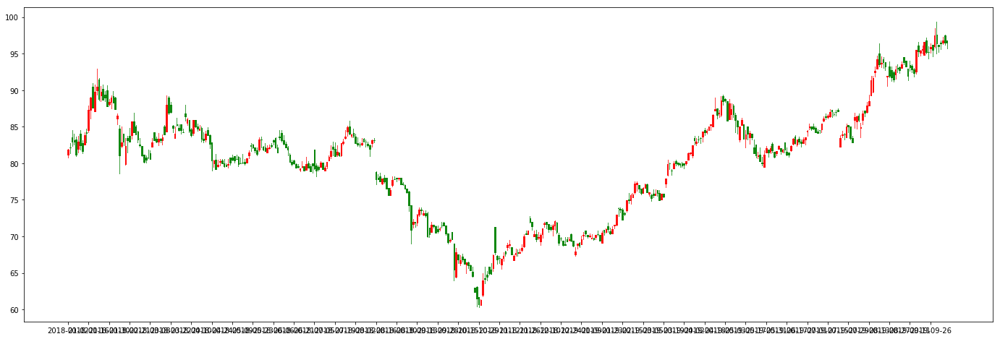

In [6]:
start = datetime.datetime(2018,1,1)
df = pdr.DataReader('5434.TW', 'yahoo', start=start)
df.index = df.index.format(formatter=lambda x: x.strftime('%Y-%m-%d')) 

fig = plt.figure(figsize=(24, 8))

ax = fig.add_subplot(1, 1, 1)
ax.set_xticks(range(0, len(df.index), 10))
ax.set_xticklabels(df.index[::10])
mpf.candlestick2_ochl(ax, df['Open'], df['Close'], df['High'],
                      df['Low'], width=0.6, colorup='r', colordown='g', alpha=0.75); 

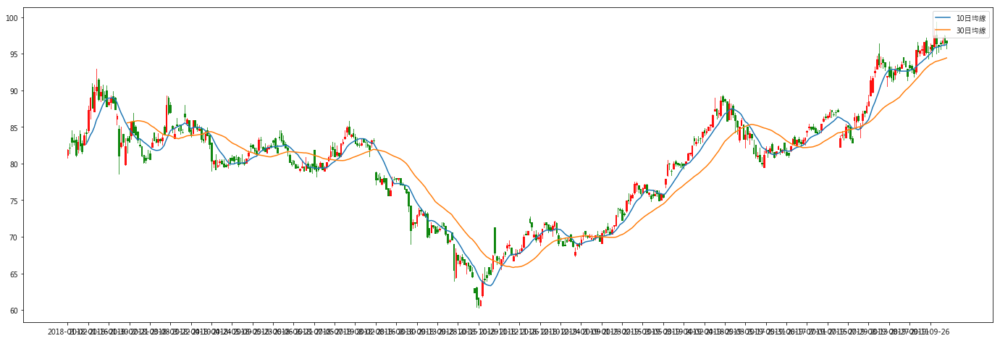

In [7]:
sma_10 = talib.SMA(np.array(df['Close']), 10)
sma_30 = talib.SMA(np.array(df['Close']), 30)

fig = plt.figure(figsize=(24, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_xticks(range(0, len(df.index), 10))
ax.set_xticklabels(df.index[::10])
mpf.candlestick2_ochl(ax, df['Open'], df['Close'], df['High'],
                      df['Low'], width=0.6, colorup='r', colordown='g', alpha=0.75)
plt.rcParams['font.sans-serif']=['Microsoft JhengHei'] 
ax.plot(sma_10, label=u'10日均線')
ax.plot(sma_30, label=u'30日均線')
ax.legend();

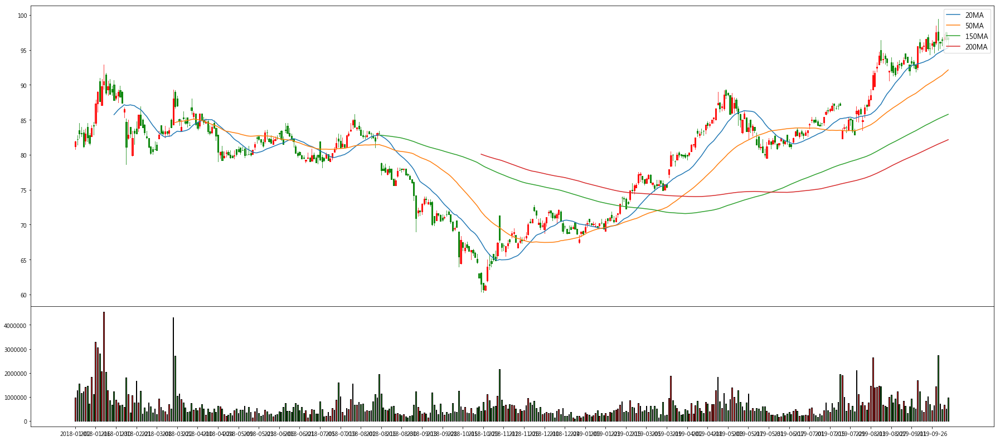

In [8]:
sma_20 = talib.SMA(np.array(df['Close']), 20)
sma_50 = talib.SMA(np.array(df['Close']), 50)
sma_150 = talib.SMA(np.array(df['Close']), 150)
sma_200 = talib.SMA(np.array(df['Close']), 200)

fig = plt.figure(figsize=(24, 15))
ax = fig.add_axes([0,0.2,1,0.5])
ax2 = fig.add_axes([0,0,1,0.2])

ax.set_xticks(range(0, len(df.index), 10))
ax.set_xticklabels(df.index[::10])
mpf.candlestick2_ochl(ax, df['Open'], df['Close'], df['High'],
                      df['Low'], width=0.6, colorup='r', colordown='g', alpha=0.75)
plt.rcParams['font.sans-serif']=['Microsoft JhengHei'] 
#ax.plot(sma_20, label=u'20日均線')
#ax.plot(sma_50, label=u'50日均線')
ax.plot(sma_20, label='20MA')
ax.plot(sma_50, label='50MA')
ax.plot(sma_150, label='150MA')
ax.plot(sma_200, label='200MA')

mpf.volume_overlay(ax2, df['Open'], df['Close'], df['Volume'], colorup='r', colordown='g', width=0.5, alpha=0.8)
ax2.set_xticks(range(0, len(df.index), 10))
ax2.set_xticklabels(df.index[::10])

# https://matplotlib.org/api/pyplot_api.html#matplotlib.pyplot.legend
# ax.legend();
ax.legend(loc=1, prop={'size': 12});


In [9]:
# Get global Index
# https://finance.yahoo.com/world-indices/

'''
requests.get來獲取此網頁的資料，網頁中的資料都存在response.text中。

我們使用io.StringIO(response.text)將資料存成檔案f
我們將此文件利用pd.read_html(f)來分析網頁f中的表格，將所有的表格存成 a list of dataframe
我們將第一張dataframe給拿出來塞給world_index。
'''
import requests

url = "https://finance.yahoo.com/world-indices/"
response = requests.get(url)

import io
f = io.StringIO(response.text)
dfs = pd.read_html(f)
world_index = dfs[0]

world_index

,Symbol,Name,Last Price,Change,% Change,Volume,Intraday High/Low,52 Week Range,Day Chart
0,^GSPC,S&P 500,2970.27,+32.14,+1.09%,1.953B,NaN,NaN,NaN
1,^DJI,Dow 30,26816.59,+319.92,+1.21%,283.534M,NaN,NaN,NaN
2,^IXIC,Nasdaq,8057.04,+106.26,+1.34%,1.883B,NaN,NaN,NaN
3,^NYA,NYSE COMPOSITE (DJ),12926.92,+160.92,+1.26%,0,NaN,NaN,NaN
4,^XAX,NYSE AMEX COMPOSITE INDEX,2431.61,+29.20,+1.22%,0,NaN,NaN,NaN
5,^BUK100P,Cboe UK 100 Price Return,12277.92,+70.77,+0.58%,0,NaN,NaN,NaN
6,^RUT,Russell 2000,1511.90,+26.54,+1.79%,0,NaN,NaN,NaN
7,^VIX,Vix,15.58,-1.99,-11.33%,0,NaN,NaN,NaN
8,^FTSE,FTSE 100,7247.08,+60.72,+0.84%,0,NaN,NaN,NaN
9,^GDAXI,DAX PERFORMANCE-INDEX,12511.65,+347.45,+2.86%,0,NaN,NaN,NaN


In [10]:
# 5434.TW=> https://finance.yahoo.com/quote/5434.TW?p=5434.TW&.tsrc=fin-srch
# Taiwan Weighted Index=> ^TWII=> https://finance.yahoo.com/quote/%5ETWII?p=^TWII&.tsrc=fin-srch

df_TWII = pdr.DataReader('^TWII', 'yahoo')
df_TWII

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2010-01-04,8240.450195,8143.450195,8222.419922,8207.849609,6.429400e+06,8207.817383
2010-01-05,8283.639648,8162.540039,8277.709961,8211.400391,6.762000e+06,8211.368164
2010-01-06,8327.870117,8216.919922,8237.099609,8327.620117,6.421600e+06,8327.587891
2010-01-07,8369.549805,8233.589844,8344.559570,8237.419922,7.133000e+06,8237.387695
2010-01-08,8290.660156,8178.930176,8266.870117,8280.900391,5.764400e+06,8280.868164
2010-01-11,8357.900391,8281.719727,8291.519531,8323.820312,5.857000e+06,8323.788086
2010-01-12,8356.969727,8262.580078,8343.730469,8309.370117,5.246000e+06,8309.337891
2010-01-13,8257.830078,8194.809570,8229.250000,8196.559570,4.925600e+06,8196.527344
2010-01-14,8313.940430,8237.669922,8245.860352,8289.980469,4.837200e+06,8289.948242


In [11]:
# sma_50 = talib.SMA(np.array(df['Close']), 50)
# Constructing DataFrame from numpy ndarray:

df_sma20 = pd.DataFrame(data=sma_20,columns=['sma20'])
df_sma50 = pd.DataFrame(data=sma_50,columns=['sma50'])
df_sma150 = pd.DataFrame(data=sma_150,columns=['sma150'])
df_sma200 = pd.DataFrame(data=sma_200,columns=['sma200'])

print(len(df.index), len(df_sma20.index), len(df_sma50.index), len(df_sma150.index), len(df_sma200.index))

(429, 429, 429, 429, 429)


In [12]:
result_merge_failed = pd.merge(df_sma20, df_sma50)
result_merge_failed

MergeError: No common columns to perform merge on. Merge options: left_on=None, right_on=None, left_index=False, right_index=False

In [15]:
# We can use merge and concat to add columns after other columns

In [16]:
# How would you perform a merge of two dataframes with no columns in common using pandas?
# ERROR: No common columns to perform merge on
# !! you need merge with temporary columns tmp of both DataFrames:

#Add a new column named Tmp and use apply lambda to let every single row show row index value:
#To access the index in this case you access the name attribute:
# column.name return label name of column (i.e. sma20, sma50, etc.), row.name return label name of row (i.e. 0, 1, 2, etc.)
# apply has not access to the index; it treats each row as a numpy object, this case:
# the index that you get from row.name is the numerical label name of the row. If you have a custom index 
# (say a string UUID for each row) you only get the custom index (i.e. UUID)

'''
df_sma20['Tmp'] = df_sma20.apply(lambda row: row.name, axis=1)
df_sma50['Tmp'] = df_sma50.apply(lambda row: row.name, axis=1)

resule_merge_success = pd.merge(df_sma20, df_sma50, on=['Tmp'])

# drop the column we just created for merge
resule_merge_success = resule_merge_success.drop('Tmp', axis=1)

resule_merge_success
'''

"\ndf_sma20['Tmp'] = df_sma20.apply(lambda row: row.name, axis=1)\ndf_sma50['Tmp'] = df_sma50.apply(lambda row: row.name, axis=1)\n\nresule_merge_success = pd.merge(df_sma20, df_sma50, on=['Tmp'])\n\n# drop the column we just created for merge\nresule_merge_success = resule_merge_success.drop('Tmp', axis=1)\n\nresule_merge_success\n"

In [17]:
# To concatenate an arbitrary number of pandas objects (DataFrame or Series), use concat.
# axis : {0, 1, …}, default 0. The axis to concatenate along.
# the index (0 or ‘index’ or 'row') or columns (1 or ‘columns’)

# https://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html#concatenating-with-mixed-ndims
'''
result_concat = pd.concat([df_sma20, df_sma50], axis=1)
result_concat
'''

'\nresult_concat = pd.concat([df_sma20, df_sma50], axis=1)\nresult_concat\n'

In [18]:
df

,High,Low,Open,Close,Volume,Adj Close
2018-01-02,82.000000,80.800003,81.199997,81.900002,984178.0,73.028946
2018-01-03,82.800003,81.400002,82.199997,82.199997,1282467.0,73.296448
2018-01-04,84.500000,82.400002,83.500000,83.000000,1541699.0,74.009804
2018-01-05,84.000000,82.599998,83.099998,83.000000,1162723.0,74.009804
2018-01-08,83.599998,81.000000,83.199997,81.199997,1233151.0,72.404762
2018-01-09,83.699997,81.500000,82.000000,83.000000,1417389.0,74.009804
2018-01-10,84.500000,81.900002,84.000000,82.500000,1448884.0,73.563950
2018-01-11,83.099998,81.400002,82.800003,81.699997,728866.0,72.850601
2018-01-12,84.199997,82.599998,82.599998,83.800003,1820148.0,74.723145
2018-01-15,84.699997,82.900002,84.199997,84.099998,1112291.0,74.990646


In [19]:
list(df.index)

['2018-01-02',
 '2018-01-03',
 '2018-01-04',
 '2018-01-05',
 '2018-01-08',
 '2018-01-09',
 '2018-01-10',
 '2018-01-11',
 '2018-01-12',
 '2018-01-15',
 '2018-01-16',
 '2018-01-17',
 '2018-01-18',
 '2018-01-19',
 '2018-01-22',
 '2018-01-23',
 '2018-01-24',
 '2018-01-25',
 '2018-01-26',
 '2018-01-29',
 '2018-01-30',
 '2018-01-31',
 '2018-02-01',
 '2018-02-02',
 '2018-02-05',
 '2018-02-06',
 '2018-02-07',
 '2018-02-08',
 '2018-02-09',
 '2018-02-12',
 '2018-02-21',
 '2018-02-22',
 '2018-02-23',
 '2018-02-26',
 '2018-02-27',
 '2018-03-01',
 '2018-03-02',
 '2018-03-05',
 '2018-03-06',
 '2018-03-07',
 '2018-03-08',
 '2018-03-09',
 '2018-03-12',
 '2018-03-13',
 '2018-03-14',
 '2018-03-15',
 '2018-03-16',
 '2018-03-19',
 '2018-03-20',
 '2018-03-21',
 '2018-03-22',
 '2018-03-23',
 '2018-03-26',
 '2018-03-27',
 '2018-03-28',
 '2018-03-29',
 '2018-03-30',
 '2018-04-02',
 '2018-04-03',
 '2018-04-09',
 '2018-04-10',
 '2018-04-11',
 '2018-04-12',
 '2018-04-13',
 '2018-04-16',
 '2018-04-17',
 '2018-04-

In [20]:
# Change the row indexes: df.index = ['Row_1', 'Row_2', 'Row_3', 'Row_4']

df_sma20.index = list(df.index)
df_sma50.index = list(df.index)
df_sma150.index = list(df.index)
df_sma200.index = list(df.index)

df_sma50

,sma50
2018-01-02,NaN
2018-01-03,NaN
2018-01-04,NaN
2018-01-05,NaN
2018-01-08,NaN
2018-01-09,NaN
2018-01-10,NaN
2018-01-11,NaN
2018-01-12,NaN
2018-01-15,NaN


In [21]:
result = pd.concat([df, df_sma20, df_sma50, df_sma150, df_sma200], axis=1)
result

,High,Low,Open,Close,Volume,Adj Close,sma20,sma50,sma150,sma200
2018-01-02,82.000000,80.800003,81.199997,81.900002,984178.0,73.028946,NaN,NaN,NaN,NaN
2018-01-03,82.800003,81.400002,82.199997,82.199997,1282467.0,73.296448,NaN,NaN,NaN,NaN
2018-01-04,84.500000,82.400002,83.500000,83.000000,1541699.0,74.009804,NaN,NaN,NaN,NaN
2018-01-05,84.000000,82.599998,83.099998,83.000000,1162723.0,74.009804,NaN,NaN,NaN,NaN
2018-01-08,83.599998,81.000000,83.199997,81.199997,1233151.0,72.404762,NaN,NaN,NaN,NaN
2018-01-09,83.699997,81.500000,82.000000,83.000000,1417389.0,74.009804,NaN,NaN,NaN,NaN
2018-01-10,84.500000,81.900002,84.000000,82.500000,1448884.0,73.563950,NaN,NaN,NaN,NaN
2018-01-11,83.099998,81.400002,82.800003,81.699997,728866.0,72.850601,NaN,NaN,NaN,NaN
2018-01-12,84.199997,82.599998,82.599998,83.800003,1820148.0,74.723145,NaN,NaN,NaN,NaN
2018-01-15,84.699997,82.900002,84.199997,84.099998,1112291.0,74.990646,NaN,NaN,NaN,NaN


In [22]:
# Drop by Name
close = df.drop(['High', 'Low', 'Open', 'Volume', 'Adj Close'], axis=1)
close

,Close
2018-01-02,81.900002
2018-01-03,82.199997
2018-01-04,83.000000
2018-01-05,83.000000
2018-01-08,81.199997
2018-01-09,83.000000
2018-01-10,82.500000
2018-01-11,81.699997
2018-01-12,83.800003
2018-01-15,84.099998


In [23]:
# Select the ones you want
close = df[['Close']]
close

,Close
2018-01-02,81.900002
2018-01-03,82.199997
2018-01-04,83.000000
2018-01-05,83.000000
2018-01-08,81.199997
2018-01-09,83.000000
2018-01-10,82.500000
2018-01-11,81.699997
2018-01-12,83.800003
2018-01-15,84.099998


In [24]:
import requests

res = requests.get("http://isin.twse.com.tw/isin/C_public.jsp?strMode=2")

import pandas as pd
pd.set_option('display.max_rows', None) #show every row for pandas
pd.set_option('display.max_columns', None) #show every column for pandas

'''
IOPub data rate exceeded. The notebook server will temporarily stop sending output to the client in order to 
avoid crashing it. To change this limit, set the config variable `--NotebookApp.iopub_data_rate_limit`

solution:
    jupyter notebook --NotebookApp.iopub_data_rate_limit=2147483647
'''

dftest = pd.read_html(res.text)[0]
dftest

,0,1,2,3,4,5,6
0,有價證券代號及名稱,國際證券辨識號碼(ISIN Code),上市日,市場別,產業別,CFICode,備註
1,股票,股票,股票,股票,股票,股票,股票
2,1101 台泥,TW0001101004,1962/02/09,上市,水泥工業,ESVUFR,NaN
3,1102 亞泥,TW0001102002,1962/06/08,上市,水泥工業,ESVUFR,NaN
4,1103 嘉泥,TW0001103000,1969/11/14,上市,水泥工業,ESVUFR,NaN
5,1104 環泥,TW0001104008,1971/02/01,上市,水泥工業,ESVUFR,NaN
6,1108 幸福,TW0001108009,1990/06/06,上市,水泥工業,ESVUFR,NaN
7,1109 信大,TW0001109007,1991/12/05,上市,水泥工業,ESVUFR,NaN
8,1110 東泥,TW0001110005,1994/10/22,上市,水泥工業,ESVUFR,NaN
9,1201 味全,TW0001201002,1962/02/09,上市,食品工業,ESVUFR,NaN


In [25]:
#目前column名稱只是1、2、3、4，一些數字而已，但我們希望它們是有意義的文字，
# 而我們又可以發現，其中第一行row，就是我們所需要的，所以，我們可以將第一行變成columns的名稱：

def get_basic_info_for_ftock(stocktype):

    #get basic info of company
    '''
    抓取上市櫃股票的代號、名稱...等資料。
    上市
    http://isin.twse.com.tw/isin/C_public.jsp?strMode=2
    上櫃
    http://isin.twse.com.tw/isin/C_public.jsp?strMode=4
    '''
    #http://bloggerkaiweng.blogspot.com/2016/09/python.html

    if(stocktype == 'sii'):
        url='http://isin.twse.com.tw/isin/C_public.jsp?strMode=2'
    else:
        url='http://isin.twse.com.tw/isin/C_public.jsp?strMode=4'
    
    r = requests.get(url, stream=True)#, verify=False, proxies=proxyDict)
    r.encoding = 'big5hkscs'
    dfshow = pd.read_html(r.text, header=None)

    for i, df in enumerate(dfshow):
        df.columns = df.iloc[0]
        dfshow[i] = df.iloc[1:]

    # dataframe filter: df_filtered = df[df['column'] == value]
    df = pd.concat(dfshow).applymap(lambda x: x if x != '--' else np.nan)
    #df = df[df[u'有價證券代號及名稱'] != u'股票']
    df = df[~df[u'有價證券代號及名稱'].isnull()]
    df = df.reset_index(drop=True)
    
    newdf=df[df[u'產業別'] > '0']
    del newdf[u'國際證券辨識號碼(ISIN Code)'],newdf['CFICode'],newdf[u'備註']

    df2=newdf[u'有價證券代號及名稱'].str.split(u' ', expand=True)
    df2 = df2.reset_index(drop=True)
    newdf = newdf.reset_index(drop=True)
    for i in df2.index:
        if u'　' in df2.iat[i,0]:
            df2.iat[i,1]=df2.iat[i,0].split(u'　')[1]
            df2.iat[i,0]=df2.iat[i,0].split(u'　')[0]
    newdf=df2.join(newdf)
    newdf=newdf.rename(columns = {0:u'公司代號',1:u'股票名稱'})
    del newdf[u'有價證券代號及名稱']

    return newdf

In [26]:
df_basicinfo_sii = get_basic_info_for_ftock('sii')#.convert_objects(convert_numeric=True) #轉成float型態
df_basicinfo_otc = get_basic_info_for_ftock('otc')#.convert_objects(convert_numeric=True) #轉成float型態

df_basicinfo = pd.concat([df_basicinfo_sii,df_basicinfo_otc],axis=0, ignore_index=True)

In [27]:
df_basicinfo

,公司代號,股票名稱,上市日,市場別,產業別
0,股票,None,股票,股票,股票
1,1101,台泥,1962/02/09,上市,水泥工業
2,1102,亞泥,1962/06/08,上市,水泥工業
3,1103,嘉泥,1969/11/14,上市,水泥工業
4,1104,環泥,1971/02/01,上市,水泥工業
5,1108,幸福,1990/06/06,上市,水泥工業
6,1109,信大,1991/12/05,上市,水泥工業
7,1110,東泥,1994/10/22,上市,水泥工業
8,1201,味全,1962/02/09,上市,食品工業
9,1203,味王,1964/08/24,上市,食品工業


In [28]:
del df_basicinfo[u'股票名稱']
del df_basicinfo[u'上市日']
del df_basicinfo[u'市場別']
del df_basicinfo[u'產業別']
df_basicinfo

,公司代號
0,股票
1,1101
2,1102
3,1103
4,1104
5,1108
6,1109
7,1110
8,1201
9,1203


In [29]:
df_basicinfo.filter(regex='^(\d{4})$', axis=0)

,公司代號
1000,2230
1001,2235
1002,2596
1003,2640
1004,2641
1005,2643
1006,2718
1007,2719
1008,2724
1009,2726


In [30]:
import re

list_companycode = []

for index, row in df_basicinfo.iterrows():
    if re.match("^(\d{4})$", row[u'公司代號']) != None:
        list_companycode.append(row[u'公司代號'])

len(list_companycode)

1711

In [31]:
list_companycode[0]

u'1101'

In [32]:
import re

list_companycode = []

for index, row in df_basicinfo.iterrows():
    if re.match("^(\d{4})$", row[u'公司代號']) != None:
        #use encode to ASCII if you don't need to translate the non-ASCII characters (i.e. unicode)
        list_companycode.append(row[u'公司代號'].encode('ascii','ignore'))

list_companycode[0]

'1101'

In [33]:
for item in list_companycode:
    print(item)

1101
1102
1103
1104
1108
1109
1110
1201
1203
1210
1213
1215
1216
1217
1218
1219
1220
1225
1227
1229
1231
1232
1233
1234
1235
1236
1256
1301
1303
1304
1305
1307
1308
1309
1310
1312
1313
1314
1315
1316
1319
1321
1323
1324
1325
1326
1337
1338
1339
1340
1341
1402
1409
1410
1413
1414
1416
1417
1418
1419
1423
1432
1434
1435
1436
1437
1438
1439
1440
1441
1442
1443
1444
1445
1446
1447
1449
1451
1452
1453
1454
1455
1456
1457
1459
1460
1463
1464
1465
1466
1467
1468
1470
1471
1472
1473
1474
1475
1476
1477
1503
1504
1506
1507
1512
1513
1514
1515
1516
1517
1519
1521
1522
1524
1525
1526
1527
1528
1529
1530
1531
1532
1533
1535
1536
1537
1538
1539
1540
1541
1558
1560
1568
1582
1583
1587
1589
1590
1592
1598
1603
1604
1605
1608
1609
1611
1612
1614
1615
1616
1617
1618
1626
1701
1702
1707
1708
1709
1710
1711
1712
1713
1714
1717
1718
1720
1721
1722
1723
1724
1725
1726
1727
1730
1731
1732
1733
1734
1735
1736
1737
1760
1762
1773
1776
1783
1786
1789
1802
1805
1806
1808
1809
1810
1817
1902
1903
1904
1905
1906


In [34]:
def crawl_price(code, startYear, startMonth, startDate):
    start = datetime.datetime(startYear,startMonth,startDate)
    #sii代表上市, otc代表上櫃, rotc代表興櫃
    try:
        df = pdr.DataReader(code + '.TW', 'yahoo', start=start) #上市
    except:
        df = pdr.DataReader(code + '.TWO', 'yahoo', start=start) #上櫃
    df.index = df.index.format(formatter=lambda x: x.strftime('%Y-%m-%d'))
 
    #print('Get data: ' + code)
    return df

In [35]:
#Exception: real has wrong dimensions
#because np.array(df[['Close']]) is two dimensions array but we need one dimension array
#so we need to use np.array(df['Close'])
for i in range(len(list_companycode)):
    df = crawl_price(list_companycode[i], 2018, 9, 1)
    
    sma_5 = talib.SMA(np.array(df[['Close']]), 5)
    sma_20 = talib.SMA(np.array(df[['Close']]), 20)
    sma_50 = talib.SMA(np.array(df[['Close']]), 50)
    sma_150 = talib.SMA(np.array(df[['Close']]), 150)
    sma_200 = talib.SMA(np.array(df[['Close']]), 200)


Exception: real has wrong dimensions

In [36]:
#RS is not RSI
#https://www.facebook.com/usstockcap/posts/341974999344198
#https://www.facebook.com/usstockcap/posts/342263342648697
'''
不少投資者在入門初段，已聽過RSI(相對強弱指數，Relative Strength Index)，就是那個「1-100，70超買，30超賣」的技術指標。自己很少使用，
此法長短暫且按下不表。這次想講的，是另一種分析方法。兩者一字之差，但完全不同，是為相對強度(Relative Strength, RS)。

RS是用來描繪兩種價格走勢之間的關係，基本上可套用在任何「有價」的資產上，包括各種指數、個股、債券、商品、外匯。計算RS，方法極簡單，
只要將當期資產A的收市價，除以資產B的收市價，連成線形，即成。

這並非甚麼火箭科學，其實就是兩種資產的比例。外匯市場中，所謂交叉盤，其實就是兩種外幣的RS。例如歐元兌澳元(EUR.AUD)，其實相當於
EUR.USD除以AUD.USD，也就是兩者的RS。有些分析談到金油比例、金銀比率，都是RS。

如上所述，假設RS以資產A除以資產B計算，當RS向上，表示A的表現優於B。請留意，RS僅展示兩者的相對表現，A比B強，但並不表示A升B跌，
可以兩者皆升、兩者皆跌、A橫行B跌等等。以一簡例闡釋：零售ETF(RTH)股價圖，及零售ETF除以標普500指數ETF(SPY)得出的RS。從股價圖可見，
2014年一至八月，股價橫行，但RS下跌，即零售ETF表現比標普500指數差，但並不代表其下跌。2014年八月至今，零售ETF、標指均屢創新高。
而RS斜向上，代表零售跑贏大市。

或問：我炒某股，看那個股的圖表便好了，搞甚麼RS？很多投機者常有錯覺，認為自己的持倉有錢賺，也就夠了。這樣就忽略了機會成本：
假設持有一隻個股三個月，升了5%；同期板塊ETF升7%、大市指數升10%，這是甚麼概念？就是花了精力去選，冒了更大的風險(買大市比買單一板塊穩陣，
買板塊又比行單支穩陣，一隻股票一單消息隨時上落一成，大市則相對沒那麼容易)，回報卻還差人一截，豈不是嘥gas。例如上例中，2014年一至八月，
揸吓零售ETF睇落無相干，「整固啫，忍吓囉」，其實將資金泊回風險更低的標普，已可賺得超過一成。RS的用處，就是讓人一眼看清個股的相對表現，
買入前考慮清楚是否較佳對象、買入後觀察是否開始跑輸其它資產，特別是其還在慢慢上升時，最易帶來錯覺。

介紹RS數種常見用法。

(I)個股追揸沽
上回講過，即使個股有得升，若然相對弱於板塊、大市，倒不如省點力氣。所以很多動力交易者(momentum trader)入市前都會檢查股份相對大市的RS線，
過去一段時間已向上傾斜(跑贏大市)才會考慮買入。持有期間也會繼續留意，如果RS線已走平，或開始下跌，即使股價仍在上升中，基於機會成本因素，
已要考慮轉投更強勢的目標。

(II)快速篩選器
美國股票數以千計，逐一睇圖眼都盲。一個簡單的篩選法，是先找出最強勢的一堆股票，才去細細分析其它因素。動力派的快方法，是將市場上所有股票的
RS排列，然後集中在RS最高的一批中尋寶。

Stock Market Wizards中Mark Minervini有云：「假設你列出頭二百隻RS最強的股票(過去某時段內跑贏大市最多)，然後每日掟飛鏢揀三隻來買，
跌一成斬，我敢賭你一定賺錢，因為你正置身於一堆最具潛力大升的股票中，當然要有止蝕。」RS最強，也就是RS線斜度最高，與上點一脈相承，
只是更進一步，系統化地執行，避免只聚焦在自己認識的股票上而已。至於有無免費資源，容後再報。

(III)長短倉生成器
所謂長短倉，就是買入一股、沽空另一股，回報就是兩者間的差異，盡量不涉大市變化。以基本因素行事，你可以說喜歡福特(F)，不喜通用(GM)；
看好可樂(KO)，不好百事(PEP)，一揸一沽，就是長短倉。那技術分析上如何客觀地建長短倉？由於有大市的影響，很多時兩股都是同方向，
只是強弱有別，這又是RS出場之時。

RS線已綜合了兩者的走勢，可以當一種資產的圖表來看。圖一是可樂對百事的RS圖及三十周線，可見呈緩緩下降之勢。換言之，可樂比百事弱，
開長短倉應長百事短可樂。實際成績如何？假設由2013年初，RS圖弱勢已成時開始動手，至今(26/3/2015)，回報如下：
長百事：連股息總回報51.15%；短可樂：連股息總回報蝕19.65%(可樂也升，只是升得少，所以沽空要輸。)合共賺31.5%。

當大家有不同的長短倉概念，最好用RS圖check一check，看看市場對兩者的綜合看法，是否與自己大為不同，以策安全。

(IV)概念確認器
有些技術分析門派，揉合簡單的宏觀經濟概念，不過仍是以資產市價的關係作判斷，維持客觀。例如有沒有宏觀信貸危機，最簡單是觀察銀行股和黃金的
走勢。但價格升升跌跌，如何理出一個頭緒？RS幫到你。

美國地區銀行ETF(KRE)對黃金ETF(GLD)的RS。由次按揭幕的2007，至歐債危機的2011年年中，RS一直跌跌不休，這是市場關注宏觀風險的時代；
2012雖然尚有諸般新聞，但RS已趨穩，2013年更升破近期頂，當年也是美股最風光一年。市場的風險意識，一眼便可確認，總比日刨夜刨報紙，
自己嚇自己要好。還有更多類似的關係，以後有機會再一一介紹。

總結
凡有兩個價，便可計RS。沒有神秘之處，它只是簡潔地告訴你，兩者早前的關係，怎樣分析則視乎目的。
'''

'\n\xe4\xb8\x8d\xe5\xb0\x91\xe6\x8a\x95\xe8\xb3\x87\xe8\x80\x85\xe5\x9c\xa8\xe5\x85\xa5\xe9\x96\x80\xe5\x88\x9d\xe6\xae\xb5\xef\xbc\x8c\xe5\xb7\xb2\xe8\x81\xbd\xe9\x81\x8eRSI(\xe7\x9b\xb8\xe5\xb0\x8d\xe5\xbc\xb7\xe5\xbc\xb1\xe6\x8c\x87\xe6\x95\xb8\xef\xbc\x8cRelative Strength Index)\xef\xbc\x8c\xe5\xb0\xb1\xe6\x98\xaf\xe9\x82\xa3\xe5\x80\x8b\xe3\x80\x8c1-100\xef\xbc\x8c70\xe8\xb6\x85\xe8\xb2\xb7\xef\xbc\x8c30\xe8\xb6\x85\xe8\xb3\xa3\xe3\x80\x8d\xe7\x9a\x84\xe6\x8a\x80\xe8\xa1\x93\xe6\x8c\x87\xe6\xa8\x99\xe3\x80\x82\xe8\x87\xaa\xe5\xb7\xb1\xe5\xbe\x88\xe5\xb0\x91\xe4\xbd\xbf\xe7\x94\xa8\xef\xbc\x8c\n\xe6\xad\xa4\xe6\xb3\x95\xe9\x95\xb7\xe7\x9f\xad\xe6\x9a\xab\xe4\xb8\x94\xe6\x8c\x89\xe4\xb8\x8b\xe4\xb8\x8d\xe8\xa1\xa8\xe3\x80\x82\xe9\x80\x99\xe6\xac\xa1\xe6\x83\xb3\xe8\xac\x9b\xe7\x9a\x84\xef\xbc\x8c\xe6\x98\xaf\xe5\x8f\xa6\xe4\xb8\x80\xe7\xa8\xae\xe5\x88\x86\xe6\x9e\x90\xe6\x96\xb9\xe6\xb3\x95\xe3\x80\x82\xe5\x85\xa9\xe8\x80\x85\xe4\xb8\x80\xe5\xad\x97\xe4\xb9\x8b\xe5\xb7\xae\xef\xbc\x

In [38]:
# Mark Minervini Trend Template:
# 1. Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line.
# 2. The 150-day moving average is above the 200-day moving average.
# 3. The 200-day moving average line is trending up for at least 1 month.
# 4. The 50-day (10-week) moving average is above 150-day and 200-day moving averages.
# 5. The current stock price is trading above the 50-day moving average.
# 6. The current stock price is at least 30 percent above its 52-week low. ((Current - 52-week Low)/52-week Low > 0.3)
# 7. The current stock price is within at least 25 percent of its 52-week high. ((Current - 52-week high)/52-week high < 0.25)
# 8. The higher The relative strength ranking is, the stronger the stock is correspond to market. (Stock price/Market, and get the value in percentile form)
# 8. The relative strength ranking (as reported in IBD) is no less than 70, but preferably in the 90s, which will generally be the case with the better selections.
# 8. Note: The RS line should not be in a strong downtrend. I like to see the RS line in an uptrend for at least 6 weeks, preferably 13 weeks or more.

# https://jupyter-notebook.readthedocs.io/en/stable/index.html
# https://jupyter-notebook.readthedocs.io/en/stable/config.html
# https://jupyter-notebook.readthedocs.io/en/5.4.1/config.html
'''
If you want to avoid error of A connection to the notebook server could not be established. The notebook will continue trying to reconnect. Check your network connection or notebook server configuration.
You can use the following config or just save the file occasionally to let jupyter notebook don't think you are idle

Version: 5.4.1
MappingKernelManager.cull_idle_timeout : Int
Default: 0

Timeout (in seconds) after which a kernel is considered idle and ready to be culled. Values of 0 or lower disable culling. Very short timeouts may result in kernels being culled for users with poor network connections.
'''

'''
Version: 5.4.1
NotebookApp.iopub_data_rate_limit : Float
Default: 1000000

(bytes/sec) Maximum rate at which stream output can be sent on iopub before they are limited.
'''

'''
Config file and command line options
The notebook server can be run with a variety of command line arguments. A list of available options can be found below in the options section.

Defaults for these options can also be set by creating a file named jupyter_notebook_config.py in your Jupyter folder. The Jupyter folder is in your home directory, ~/.jupyter.

To create a jupyter_notebook_config.py file, with all the defaults commented out, you can use the following command line:
$ jupyter notebook --generate-config

Options
This list of options can be generated by running the following and hitting enter:
$ jupyter notebook --help

set the config variable in command line: 
$ jupyter notebook --NotebookApp.iopub_data_rate_limit=2147483647
'''


from pandas_datareader._utils import RemoteDataError
import math
list_matchCriteria = []

startYear=2018
startMonth=1
startDate=1

start = datetime.datetime(startYear,startMonth,startDate)
df_TWII = pdr.DataReader('^TWII', 'yahoo', start=start)
df_TWII.index = df_TWII.index.format(formatter=lambda x: x.strftime('%Y-%m-%d'))
df_TWII.rename(columns={'High':'High_Market',
                        'Low':'Low_Market',
                        'Open':'Open_Market',
                        'Close':'Close_Market',
                        'Volume':'Volume_Market',
                        'Adj Close':'Adj Close_Market'}, 
                 inplace=True)

#len(list_companycode)

'''
https://stackoverflow.com/questions/36249835/python-how-to-avoid-error-exceptions-in-pandas-while-still-getting-data

I'm currently using Pandas to get options data from yahoo. It works fine until there is a stock that does not have options,
at which point the program crashes. I attempted to create exceptions and just have it pass but without luck. 
How can I have the program identify stocks with no options and just skip? Thanks.

The error I get is this: RemoteDataError: Data not available

=> RemoteDataError: No data fetched for symbol 6491.TW using YahooDailyReader
'''
for i in range(len(list_companycode)):    
    try:
        df = crawl_price(list_companycode[i], startYear, startMonth, startDate)
        df_close = pd.concat([df[['Close']], df_TWII[['Close_Market']]], axis=1)
        df_high = pd.concat([df[['High']], df_TWII[['High_Market']]], axis=1)
        df_low = pd.concat([df[['Low']], df_TWII[['Low_Market']]], axis=1)

        #Adding new column to existing DataFrame in Pandas
        #By using pandas apply function to as a column.

        #pandas.DataFrame.apply: 
        '''
        Apply a function along an axis of the DataFrame.
        Objects passed to the function are Series objects whose index is either the DataFrame’s index (axis=0) or 
        the DataFrame’s columns (axis=1). By default (result_type=None), the final return type is inferred from the 
        return type of the applied function. Otherwise, it depends on the result_type argument.    
        '''

        #pandas.DataFrame.applymap
        '''
        Apply a function to a Dataframe elementwise.
        This method applies a function that accepts and returns a scalar to every element of a DataFrame.
        '''

        df_close['RS'] = df_close.apply(lambda row: row['Close']/row['Close_Market'],axis=1)
        df_high['RS'] = df_high.apply(lambda row: row['High']/row['High_Market'],axis=1)
        df_low['RS'] = df_low.apply(lambda row: row['Low']/row['Low_Market'],axis=1)

        #Percentile Rank
        #pct : bool, default False, Whether or not to display the returned rankings in percentile form.
        #http://www.datasciencemadesimple.com/percentile-rank-column-pandas-python-2/?fbclid=IwAR2PubXCxVrMpeyjGAqtng_C0sL1S2OGKTFq4Bcfvuu-2tHDFfGehHXQ-yU
        #https://stackoverflow.com/questions/43145715/how-to-calculate-a-percentile-ranking-of-a-column-of-data-relative-to-another-co?fbclid=IwAR2KXQ2hwz_Q0iIHhxULj3C87p12AI7wTgHsZgJWWVX6JWLsuGFZyBW74OY
        df_close['RS (PCT)'] = df_close.RS.rank(pct=True)
        df_high['RS (PCT)'] = df_high.RS.rank(pct=True)
        df_low['RS (PCT)'] = df_low.RS.rank(pct=True)

        #52 Weeks High and Low
        #https://stackoverflow.com/questions/38536453/find-rolling-52-week-high-on-daily-stock-market-data-in-pandas?fbclid=IwAR0RIG95leSIRNYDCppBtu3WA7DApfU_bR0V_vxs8NVLKVJBT838rwsC3v8
        #https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rolling.html
        #https://pandas.pydata.org/pandas-docs/stable/reference/window.html
        #https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.core.window.Rolling.max.html#pandas.core.window.Rolling.max
        #https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.core.window.Rolling.min.html#pandas.core.window.Rolling.min
        df_close["52WeeksHigh_Close"] = df_close.Close.rolling(window=52*5, min_periods=1).max()
        df_close["52WeeksLow_Close"] = df_close.Close.rolling(window=52*5, min_periods=1).min()
        df_high["52WeeksHigh_High"] = df_high.High.rolling(window=52*5, min_periods=1).max()
        df_low["52WeeksLow_Low"] = df_low.Low.rolling(window=52*5, min_periods=1).min()
        sma_5 = talib.SMA(np.array(df['Close']), 5)
        sma_20 = talib.SMA(np.array(df['Close']), 20)
        sma_50 = talib.SMA(np.array(df['Close']), 50)
        sma_150 = talib.SMA(np.array(df['Close']), 150)
        sma_200 = talib.SMA(np.array(df['Close']), 200)

        '''
        # Rows:
        data.iloc[0] # first row of data frame - Note a Series data type output.
        data.iloc[1] # second row of data frame
        data.iloc[-1] # last row of data frame
        # Columns:
        data.iloc[:,0] # first column of data frame
        data.iloc[:,1] # second column of data frame
        data.iloc[:,-1] # last column of data frame
        '''
        latest_stock_price_close = df['Close'].iloc[-1]

        '''
        In Python, how do you get the last element of a list?
        some_list[-1] is the shortest and most Pythonic.
        In fact, you can do much more with this syntax. The some_list[-n] syntax gets the nth-to-last element. 
        So some_list[-1] gets the last element, some_list[-2] gets the second to last, etc, 
        all the way down to some_list[-len(some_list)], which gives you the first element.

        Note that getting a list item by index will raise an IndexError if the expected item doesn't exist. 
        This means that some_list[-1] will raise an exception if some_list is empty, because an empty list can't have 
        a last element.
        '''
        latest_stock_price_close_sma_20 = sma_20[-1]
        latest_stock_price_close_sma_50 = sma_50[-1]
        latest_stock_price_close_sma_150 = sma_150[-1]
        latest_stock_price_close_sma_200 = sma_200[-1] #Last data
        if len(sma_200) >= 20:
            latest_stock_price_close_sma_200_20th_to_last = sma_200[-20] #20 days to last day
            if(math.isnan(latest_stock_price_close_sma_200_20th_to_last)):
                latest_stock_price_close_sma_200_20th_to_last = 0
        else:
            latest_stock_price_close_sma_200_20th_to_last = 0

        latest_stock_price_52weeksHigh_close = df_close["52WeeksHigh_Close"].iloc[-1]
        latest_stock_price_52weeksLow_close = df_close["52WeeksLow_Close"].iloc[-1]
        latest_stock_price_52weeksHigh_high = df_high["52WeeksHigh_High"].iloc[-1]
        latest_stock_price_52weeksLow_low = df_low["52WeeksLow_Low"].iloc[-1]

        latest_RSPercentile = df_close['RS (PCT)'].iloc[-1] #Last row of RS (PCT) column
        if len(df_close.index) >= 30:
            latest_RSPercentile_30th_to_last = df_close['RS (PCT)'].iloc[-30] #30 days to last day of RS (PCT) column
            if(math.isnan(latest_RSPercentile_30th_to_last)):
                latest_RSPercentile_30th_to_last = 0
        else:
            latest_RSPercentile_30th_to_last = 0

        matchAboveLow30P = np.abs((latest_stock_price_close - latest_stock_price_52weeksLow_low)/latest_stock_price_52weeksLow_low)
        matchWithinHigh25P = np.abs((latest_stock_price_close - latest_stock_price_52weeksHigh_high)/latest_stock_price_52weeksHigh_high)

        print('[{0}]'.format(list_companycode[i])),
        print(', Stock Price: {0}'.format(latest_stock_price_close)),
        print(', 20MA: {0}'.format(latest_stock_price_close_sma_20)),
        print(', 50MA: {0}'.format(latest_stock_price_close_sma_50)),
        print(', 150MA: {0}'.format(latest_stock_price_close_sma_150)),
        print(', 200MA: {0}'.format(latest_stock_price_close_sma_200)),
        print(', 200MA 20 days ago: {0}'.format(latest_stock_price_close_sma_200_20th_to_last)),
        print(', 52-weekHigh: {0}'.format(latest_stock_price_52weeksHigh_high)),
        print(', 52-weekLow: {0}'.format(latest_stock_price_52weeksLow_low)),
        print(', Latest RS: {0}'.format(latest_RSPercentile)),
        print(', Latest RS 6 weeks ago: {0}'.format(latest_RSPercentile_30th_to_last)),
        print(', Above Low Percent: {0}'.format(matchAboveLow30P)),
        print(', Within High Percent: {0}'.format(matchWithinHigh25P))

        # use the backslash (\) to indicate that a statement is continued on the next line
        # 1. Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line.
        # 5. The current stock price is trading above the 50-day moving average.
        if latest_stock_price_close > latest_stock_price_close_sma_50 and \
            latest_stock_price_close > latest_stock_price_close_sma_150 and \
            latest_stock_price_close > latest_stock_price_close_sma_200:  
            # 2. The 150-day moving average is above the 200-day moving average.
            # 4. The 50-day (10-week) moving average is above 150-day and 200-day moving averages.
            if latest_stock_price_close_sma_50 > latest_stock_price_close_sma_150 and \
                latest_stock_price_close_sma_150 > latest_stock_price_close_sma_200:
                # 6. The current stock price is at least 30 percent above its 52-week low.
                if matchAboveLow30P > 0.3:
                    # 7. The current stock price is within at least 25 percent of its 52-week high.
                    if matchWithinHigh25P < 0.25:
                        # 3. The 200-day moving average line is trending up for at least 1 month.
                        if latest_stock_price_close_sma_200 > latest_stock_price_close_sma_200_20th_to_last:
                            # 8. The higher The relative strength ranking is, the stronger the stock is correspond to market. (Stock price/Market, and get the value in percentile form)
                            # 8. The relative strength ranking (as reported in IBD) is no less than 70, but preferably in the 90s, which will generally be the case with the better selections.                                    
                            if latest_RSPercentile >= 0.7:
                                # 8. Note: The RS line should not be in a strong downtrend. I like to see the RS line in an uptrend for at least 6 weeks, preferably 13 weeks or more.
                                if latest_RSPercentile > latest_RSPercentile_30th_to_last:
                                    print('Add ({0}) to list.'.format(list_companycode[i]))
                                    '''
                                    print(', Stock Price: {0}'.format(latest_stock_price_close)),
                                    print(', 20MA: {0}'.format(latest_stock_price_close_sma_20)),
                                    print(', 50MA: {0}'.format(latest_stock_price_close_sma_50)),
                                    print(', 150MA: {0}'.format(latest_stock_price_close_sma_150)),
                                    print(', 200MA: {0}'.format(latest_stock_price_close_sma_200)),
                                    '''            
                                    list_matchCriteria.append(list_companycode[i])
                                    #print 不換行早期作法
                                    #print('Hello World'),
                                    #print(', Same Line')
                                    #print 不換行python3
                                    #print('Hello World', end='')
                                    #print(', Same Line')
                                else:
                                    print('({0}) do not match [8]The RS line in an uptrend for at least 6 weeks'.format(list_companycode[i]))
                            else:
                                print('({0}) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70'.format(list_companycode[i]))
                        else:
                            print('({0}) do not match [3]The 200-day moving average line is trending up for at least 1 month'.format(list_companycode[i]))
                    else:
                        print('({0}) do not match [7]The current stock price is within at least 25 percent of its 52-week high'.format(list_companycode[i]))
                else:
                    print('({0}) do not match [6]The current stock price is at least 30 percent above its 52-week low'.format(list_companycode[i]))
            else:
                print('({0}) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages'.format(list_companycode[i]))
        else:
            print('({0}) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average'.format(list_companycode[i]))

        #print(list_matchCriteria)
    except (RemoteDataError, ValueError) as error:
        #https://docs.python.org/2/library/exceptions.html
        #pass # doing nothing on exception
        print("****************************************************")
        print("No information for ticker '%s'" % list_companycode[i])
        print('Error: {0}'.format(error))
        print("****************************************************")
        continue

C:\ProgramData\Anaconda2\lib\site-packages\ipykernel_launcher.py:88: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

C:\ProgramData\Anaconda2\lib\site-packages\ipykernel_launcher.py:89: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

C:\ProgramData\Anaconda2\lib\site-packages\ipykernel_launcher.py:90: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



[1101] , Stock Price: 39.5 , 20MA: 39.6725000381 , 50MA: 39.4999119568 , 150MA: 39.6337199656 , 200MA: 38.2083019447 , 200MA 20 days ago: 37.578099966 , 52-weekHigh: 43.547000885 , 52-weekLow: 30.5576000214 , Latest RS: 0.740654205607 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.292640782404 , Within High Percent: 0.0929340896678
(1101) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1102] , Stock Price: 42.2999992371 , 20MA: 43.2574998856 , 50MA: 42.5859999847 , 150MA: 43.0023333995 , 200MA: 41.153500061 , 200MA 20 days ago: 40.2137500763 , 52-weekHigh: 48.9000015259 , 52-weekLow: 30.3999996185 , Latest RS: 0.74358974359 , Latest RS 6 weeks ago: 0.857808857809 , Above Low Percent: 0.391447360785 , Within High Percent: 0.134969367748
(1102) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-w

[1220] , Stock Price: 9.96000003815 , 20MA: 10.0059999943 , 50MA: 10.1804000092 , 150MA: 10.8437999471 , 200MA: 10.8723499489 , 200MA 20 days ago: 11.0269999361 , 52-weekHigh: 13.0 , 52-weekLow: 9.77000045776 , Latest RS: 0.013986013986 , Latest RS 6 weeks ago: 0.100233100233 , Above Low Percent: 0.0194472437545 , Within High Percent: 0.233846150912
(1220) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1225] , Stock Price: 37.0 , 20MA: 42.4199998856 , 50MA: 48.7849997711 , 150MA: 63.7083332825 , 200MA: 66.2277500153 , 200MA 20 days ago: 69.4215000725 , 52-weekHigh: 88.9000015259 , 52-weekLow: 36.4000015259 , Latest RS: 0.00467289719626 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0164834738728 , Within High Percent: 0.583802031891
(1225) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-wee

[1308] , Stock Price: 14.6000003815 , 20MA: 14.9500000954 , 50MA: 15.0820000267 , 150MA: 14.4343333371 , 200MA: 14.2400000048 , 200MA 20 days ago: 14.1334999895 , 52-weekHigh: 16.7999992371 , 52-weekLow: 12.6499996185 , Latest RS: 0.193473193473 , Latest RS 6 weeks ago: 0.545454545455 , Above Low Percent: 0.154150262588 , Within High Percent: 0.13095231878
(1308) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1309] , Stock Price: 10.9499998093 , 20MA: 11.4050000668 , 50MA: 10.881000042 , 150MA: 10.4794556491 , 200MA: 10.3351804876 , 200MA 20 days ago: 10.234004488 , 52-weekHigh: 14.803899765 , 52-weekLow: 9.04901981354 , Latest RS: 0.314685314685 , Latest RS 6 weeks ago: 0.363636363636 , Above Low Percent: 0.210075791069 , Within High Percent: 0.260330049306
(1309) do not match [6]The current stock price is at least 30 percent above its

[1339] , Stock Price: 44.1500015259 , 20MA: 43.5974996567 , 50MA: 42.0679998779 , 150MA: 37.7546664937 , 200MA: 37.0272498894 , 200MA 20 days ago: 36.1947499466 , 52-weekHigh: 49.9500007629 , 52-weekLow: 31.2999992371 , Latest RS: 0.951048951049 , Latest RS 6 weeks ago: 0.995337995338 , Above Low Percent: 0.410543214123 , Within High Percent: 0.116116099068
(1339) do not match [8]The RS line in an uptrend for at least 6 weeks
[1340] , Stock Price: 15.8500003815 , 20MA: 16.4775000095 , 50MA: 16.3374539375 , 150MA: 17.0433919334 , 200MA: 16.835273447 , 200MA 20 days ago: 16.9511144304 , 52-weekHigh: 26.2726993561 , 52-weekLow: 15.0909004211 , Latest RS: 0.002331002331 , Latest RS 6 weeks ago: 0.0839160839161 , Above Low Percent: 0.0503018334985 , Within High Percent: 0.396712147212
(1340) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[134

[1436] , Stock Price: 35.9000015259 , 20MA: 36.0475002289 , 50MA: 35.3781661224 , 150MA: 34.4813314692 , 200MA: 33.5143321037 , 200MA 20 days ago: 33.0529150772 , 52-weekHigh: 36.7999992371 , 52-weekLow: 29.25 , Latest RS: 0.902097902098 , Latest RS 6 weeks ago: 0.993006993007 , Above Low Percent: 0.227350479517 , Within High Percent: 0.02445646005
(1436) do not match [6]The current stock price is at least 30 percent above its 52-week low
[1437] , Stock Price: 22.6000003815 , 20MA: 22.7324999809 , 50MA: 22.88 , 150MA: 20.946333313 , 200MA: 20.3212499714 , 200MA 20 days ago: 19.8497499752 , 52-weekHigh: 24.2000007629 , 52-weekLow: 16.8500003815 , Latest RS: 0.892773892774 , Latest RS 6 weeks ago: 0.990675990676 , Above Low Percent: 0.341246283076 , Within High Percent: 0.0661157161582
(1437) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average


[1454] , Stock Price: 8.0 , 20MA: 8.01550014019 , 50MA: 8.01060004234 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 8.26000022888 , 52-weekLow: 7.65999984741 , Latest RS: 0.162790697674 , Latest RS 6 weeks ago: 1.0 , Above Low Percent: 0.0443864437808 , Within High Percent: 0.0314770244161
(1454) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1455] , Stock Price: 8.34000015259 , 20MA: 8.61599993706 , 50MA: 8.58559999466 , 150MA: 8.84679998398 , 200MA: 8.88934999466 , 200MA 20 days ago: 8.94414999962 , 52-weekHigh: 10.6999998093 , 52-weekLow: 8.30000019073 , Latest RS: 0.00467289719626 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.00481927240167 , Within High Percent: 0.220560719509
(1455) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and 

[1474] , Stock Price: 8.84000015259 , 20MA: 8.94149999619 , 50MA: 9.27780000687 , 150MA: 9.9554000028 , 200MA: 10.1033000135 , 200MA 20 days ago: 10.258900032 , 52-weekHigh: 11.25 , 52-weekLow: 8.80000019073 , Latest RS: 0.011655011655 , Latest RS 6 weeks ago: 0.0979020979021 , Above Low Percent: 0.00454545011205 , Within High Percent: 0.214222208659
(1474) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1475] , Stock Price: 5.17999982834 , 20MA: 5.43650000095 , 50MA: 5.3184000206 , 150MA: 6.58746667862 , 200MA: 7.60625001431 , 200MA 20 days ago: 8.06495000362 , 52-weekHigh: 13.4499998093 , 52-weekLow: 4.90000009537 , Latest RS: 0.013986013986 , Latest RS 6 weeks ago: 0.100233100233 , Above Low Percent: 0.057142801535 , Within High Percent: 0.614869895777
(1475) do not match [1]Current stock price is above both the 150-day (30-week) and 

[1524] , Stock Price: 9.96000003815 , 20MA: 9.96800003052 , 50MA: 9.9301999855 , 150MA: 10.2703332837 , 200MA: 10.244399972 , 200MA 20 days ago: 10.2387999725 , 52-weekHigh: 10.9499998093 , 52-weekLow: 9.39999961853 , Latest RS: 0.044289044289 , Latest RS 6 weeks ago: 0.354312354312 , Above Low Percent: 0.0595745151428 , Within High Percent: 0.0904109395765
(1524) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1525] , Stock Price: 53.5999984741 , 20MA: 55.8349998474 , 50MA: 55.5479998016 , 150MA: 59.7893332926 , 200MA: 59.753500042 , 200MA 20 days ago: 59.6320000267 , 52-weekHigh: 73.5 , 52-weekLow: 49.0 , Latest RS: 0.00700934579439 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.09387751988 , Within High Percent: 0.27074832008
(1525) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) mo

[1541] , Stock Price: 35.1500015259 , 20MA: 35.4749998093 , 50MA: 35.2659998322 , 150MA: 32.5773332596 , 200MA: 32.0527499676 , 200MA 20 days ago: 31.486999979 , 52-weekHigh: 40.0 , 52-weekLow: 24.75 , Latest RS: 0.474299065421 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.420202081854 , Within High Percent: 0.121249961853
(1541) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1558] , Stock Price: 132.0 , 20MA: 133.15 , 50MA: 133.19 , 150MA: 141.956666667 , 200MA: 141.1975 , 200MA 20 days ago: 142.015 , 52-weekHigh: 153.0 , 52-weekLow: 130.0 , Latest RS: 0.321678321678 , Latest RS 6 weeks ago: 0.482517482517 , Above Low Percent: 0.0153846153846 , Within High Percent: 0.137254901961
(1558) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stoc

[1611] , Stock Price: 10.6499996185 , 20MA: 9.33400006294 , 50MA: 9.2138000679 , 150MA: 9.58326666514 , 200MA: 9.50819999695 , 200MA 20 days ago: 9.46539999008 , 52-weekHigh: 11.0 , 52-weekLow: 8.35999965668 , Latest RS: 0.827102803738 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.273923451662 , Within High Percent: 0.0318182164972
(1611) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[1612] , Stock Price: 10.4499998093 , 20MA: 10.9199999809 , 50MA: 10.4142000008 , 150MA: 10.1041333389 , 200MA: 9.98254999638 , 200MA 20 days ago: 9.84005000114 , 52-weekHigh: 11.6000003815 , 52-weekLow: 9.01000022888 , Latest RS: 0.411214953271 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.159822368902 , Within High Percent: 0.0991379771023
(1612) do not match [6]The current stock price is at least 30 percent above its 52-week low
[1614] , Stock Price: 29.25 , 20MA: 28.745000171

[1713] , Stock Price: 18.1499996185 , 20MA: 18.1525001526 , 50MA: 18.0870000076 , 150MA: 18.6646666209 , 200MA: 18.746999979 , 200MA 20 days ago: 18.7259999657 , 52-weekHigh: 19.5 , 52-weekLow: 16.5499992371 , Latest RS: 0.296728971963 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0966767646664 , Within High Percent: 0.0692307887933
(1713) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1714] , Stock Price: 7.01000022888 , 20MA: 7.10900001526 , 50MA: 7.01860003471 , 150MA: 7.00933333715 , 200MA: 6.89239999771 , 200MA 20 days ago: 6.85154999733 , 52-weekHigh: 8.05000019073 , 52-weekLow: 6.21999979019 , Latest RS: 0.107476635514 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.127009721115 , Within High Percent: 0.129192538784
(1714) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) movi

[1734] , Stock Price: 19.1000003815 , 20MA: 19.2625000954 , 50MA: 19.4230000687 , 150MA: 19.7249999746 , 200MA: 19.7574999619 , 200MA 20 days ago: 19.7844999599 , 52-weekHigh: 21.5499992371 , 52-weekLow: 18.1000003815 , Latest RS: 0.00932400932401 , Latest RS 6 weeks ago: 0.18648018648 , Above Low Percent: 0.0552486176201 , Within High Percent: 0.113689046048
(1734) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1735] , Stock Price: 17.1000003815 , 20MA: 16.1325000286 , 50MA: 15.9849999809 , 150MA: 15.7543332736 , 200MA: 15.6499999809 , 200MA 20 days ago: 15.5292499733 , 52-weekHigh: 17.8999996185 , 52-weekLow: 13.9499998093 , Latest RS: 0.904428904429 , Latest RS 6 weeks ago: 0.820512820513 , Above Low Percent: 0.225806495719 , Within High Percent: 0.0446926957603
(1735) do not match [6]The current stock price is at least 30 percent ab

[1810] , Stock Price: 7.59999990463 , 20MA: 7.60249993801 , 50MA: 7.61639997482 , 150MA: 7.81813329697 , 200MA: 7.83794996262 , 200MA 20 days ago: 7.87354997635 , 52-weekHigh: 8.94999980927 , 52-weekLow: 7.51000022888 , Latest RS: 0.0210280373832 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.011983977764 , Within High Percent: 0.150837981386
(1810) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1817] , Stock Price: 35.2999992371 , 20MA: 35.7975002289 , 50MA: 36.0650002289 , 150MA: 37.6586667887 , 200MA: 37.4457501221 , 200MA 20 days ago: 37.4797500992 , 52-weekHigh: 40.4500007629 , 52-weekLow: 33.9000015259 , Latest RS: 0.00699300699301 , Latest RS 6 weeks ago: 0.0629370629371 , Above Low Percent: 0.0412978657276 , Within High Percent: 0.127317711465
(1817) do not match [1]Current stock price is above both the 150-day (30-week) and 

[2013] , Stock Price: 24.9500007629 , 20MA: 25.2200001717 , 50MA: 24.3569999695 , 150MA: 25.4640000025 , 200MA: 25.6552499771 , 200MA 20 days ago: 25.7914999771 , 52-weekHigh: 36.75 , 52-weekLow: 22.8999996185 , Latest RS: 0.226107226107 , Latest RS 6 weeks ago: 0.177156177156 , Above Low Percent: 0.0895197021204 , Within High Percent: 0.321088414614
(2013) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2014] , Stock Price: 9.11999988556 , 20MA: 9.86449990273 , 50MA: 10.0345999908 , 150MA: 10.7938666598 , 200MA: 10.9181499815 , 200MA 20 days ago: 11.0759499979 , 52-weekHigh: 14.9499998093 , 52-weekLow: 9.11999988556 , Latest RS: 0.00233644859813 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0 , Within High Percent: 0.389966555056
(2014) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week)

[2034] , Stock Price: 26.25 , 20MA: 26.3700001717 , 50MA: 26.3240000153 , 150MA: 26.3383333588 , 200MA: 25.9660000229 , 200MA 20 days ago: 25.8122500134 , 52-weekHigh: 27.6499996185 , 52-weekLow: 23.75 , Latest RS: 0.273364485981 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.105263157895 , Within High Percent: 0.0506328982946
(2034) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2038] , Stock Price: 7.40000009537 , 20MA: 7.43899996281 , 50MA: 7.26040000916 , 150MA: 7.55493335724 , 200MA: 7.67165001631 , 200MA 20 days ago: 7.76360001802 , 52-weekHigh: 11.25 , 52-weekLow: 6.96000003815 , Latest RS: 0.0957943925234 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0632183986794 , Within High Percent: 0.342222213745
(2038) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average pr

[2115] , Stock Price: 39.9000015259 , 20MA: 39.4800008774 , 50MA: 39.245666275 , 150MA: 37.7952233378 , 200MA: 36.446180439 , 200MA 20 days ago: 35.3644188595 , 52-weekHigh: 42.3810005188 , 52-weekLow: 26.1905002594 , Latest RS: 0.829836829837 , Latest RS 6 weeks ago: 0.874125874126 , Above Low Percent: 0.523453203669 , Within High Percent: 0.0585403591833
(2115) do not match [8]The RS line in an uptrend for at least 6 weeks
[2201] , Stock Price: 18.9500007629 , 20MA: 20.1150000572 , 50MA: 21.2470000458 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 24.8500003815 , 52-weekLow: 18.9500007629 , Latest RS: 0.0116279069767 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0 , Within High Percent: 0.237424528288
(2201) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2204] , Stock Price: 42.8499984741 , 20MA: 59.3637498856 , 5

[2308] , Stock Price: 127.0 , 20MA: 139.375 , 50MA: 144.84 , 150MA: 150.633333333 , 200MA: 148.4275 , 200MA 20 days ago: 147.2975 , 52-weekHigh: 167.5 , 52-weekLow: 109.0 , Latest RS: 0.294392523364 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.165137614679 , Within High Percent: 0.241791044776
(2308) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2312] , Stock Price: 10.75 , 20MA: 10.7674999237 , 50MA: 10.5369999504 , 150MA: 10.7419999568 , 200MA: 10.6699499607 , 200MA 20 days ago: 10.551499958 , 52-weekHigh: 12.3500003815 , 52-weekLow: 9.01000022888 , Latest RS: 0.651869158879 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.193118726628 , Within High Percent: 0.129554682757
(2312) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day

[2340] , Stock Price: 24.2999992371 , 20MA: 25.9639801979 , 50MA: 26.3891261292 , 150MA: 26.2810827255 , 200MA: 25.1666935349 , 200MA 20 days ago: 24.6702960205 , 52-weekHigh: 31.9412002563 , 52-weekLow: 16.8234996796 , Latest RS: 0.184149184149 , Latest RS 6 weeks ago: 0.757575757576 , Above Low Percent: 0.444408101756 , Within High Percent: 0.23922710975
(2340) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2342] , Stock Price: 19.2000007629 , 20MA: 20.2674999237 , 50MA: 20.1469999313 , 150MA: 20.3783333206 , 200MA: 20.6107499886 , 200MA 20 days ago: 21.0596205044 , 52-weekHigh: 34.1116981506 , 52-weekLow: 17.1499996185 , Latest RS: 0.0885780885781 , Latest RS 6 weeks ago: 0.219114219114 , Above Low Percent: 0.119533597085 , Within High Percent: 0.437143214678
(2342) do not match [1]Current stock price is above both the 150-day (30-we

[2362] , Stock Price: 30.6000003815 , 20MA: 30.9975000381 , 50MA: 31.2380000305 , 150MA: 30.1919999568 , 200MA: 30.1159999752 , 200MA 20 days ago: 29.8294999599 , 52-weekHigh: 33.9000015259 , 52-weekLow: 23.5 , Latest RS: 0.434579439252 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.302127675807 , Within High Percent: 0.0973451621201
(2362) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2363] , Stock Price: 8.02999973297 , 20MA: 8.1884999752 , 50MA: 8.1221999836 , 150MA: 8.27853335063 , 200MA: 8.47345000744 , 200MA 20 days ago: 8.5275500083 , 52-weekHigh: 10.3500003815 , 52-weekLow: 6.80000019073 , Latest RS: 0.0140186915888 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.180882280549 , Within High Percent: 0.224154643767
(2363) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving

[2383] , Stock Price: 124.0 , 20MA: 130.4 , 50MA: 129.82 , 150MA: 108.248666636 , 200MA: 100.324999924 , 200MA 20 days ago: 94.8679999161 , 52-weekHigh: 142.0 , 52-weekLow: 54.0999984741 , Latest RS: 0.904205607477 , Latest RS 6 weeks ago: 0 , Above Low Percent: 1.29205182065 , Within High Percent: 0.12676056338
(2383) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2385] , Stock Price: 92.1999969482 , 20MA: 91.7399997711 , 50MA: 87.8299993896 , 150MA: 78.9166666158 , 200MA: 75.5269999313 , 200MA 20 days ago: 72.566499939 , 52-weekHigh: 94.8000030518 , 52-weekLow: 52.7999992371 , Latest RS: 0.97668997669 , Latest RS 6 weeks ago: 0.934731934732 , Above Low Percent: 0.746212088646 , Within High Percent: 0.0274262238377
Add (2385) to list.
[2387] , Stock Price: 38.3499984741 , 20MA: 37.5150003433 , 50MA: 37.9250001526 , 150MA: 25.9180000432

[2412] , Stock Price: 111.5 , 20MA: 111.55 , 50MA: 109.31 , 150MA: 110.383333333 , 200MA: 109.5475 , 200MA 20 days ago: 109.1025 , 52-weekHigh: 114.0 , 52-weekLow: 104.5 , Latest RS: 0.441588785047 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.066985645933 , Within High Percent: 0.0219298245614
(2412) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[2413] , Stock Price: 17.2000007629 , 20MA: 17.8449999809 , 50MA: 17.4709999466 , 150MA: 20.0220000458 , 200MA: 20.6530000401 , 200MA 20 days ago: 20.8960000324 , 52-weekHigh: 28.2000007629 , 52-weekLow: 16.2000007629 , Latest RS: 0.0280373831776 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0617283921546 , Within High Percent: 0.390070911433
(2413) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading abov

[2431] , Stock Price: 11.3000001907 , 20MA: 11.8475000858 , 50MA: 10.9363999939 , 150MA: 10.9019999886 , 200MA: 10.4833499956 , 200MA 20 days ago: 10.2012999868 , 52-weekHigh: 13.8500003815 , 52-weekLow: 7.98000001907 , Latest RS: 0.526806526807 , Latest RS 6 weeks ago: 0.433566433566 , Above Low Percent: 0.416040120768 , Within High Percent: 0.184115532166
(2431) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[2433] , Stock Price: 48.3499984741 , 20MA: 48.6800003052 , 50MA: 48.3270001221 , 150MA: 47.6723332469 , 200MA: 46.3284999275 , 200MA 20 days ago: 45.6662499046 , 52-weekHigh: 50.2000007629 , 52-weekLow: 38.4000015259 , Latest RS: 0.742990654206 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.259114493564 , Within High Percent: 0.0368526346753
(2433) do not match [6]The current stock price is at least 30 percent above its 52-week low
[2434] , Stock Price: 6.09000015259 , 20MA: 5.62599992752 , 50MA: 5.60759997368 , 150MA: 6.90846664747 , 20

[2454] , Stock Price: 372.0 , 20MA: 379.775 , 50MA: 353.8 , 150MA: 315.71 , 200MA: 296.515 , 200MA 20 days ago: 282.4225 , 52-weekHigh: 391.0 , 52-weekLow: 199.5 , Latest RS: 0.941588785047 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.864661654135 , Within High Percent: 0.0485933503836
Add (2454) to list.
[2455] , Stock Price: 112.5 , 20MA: 109.384999847 , 50MA: 102.159999847 , 150MA: 90.1866663615 , 200MA: 83.7674997711 , 200MA 20 days ago: 78.7319997978 , 52-weekHigh: 119.0 , 52-weekLow: 50.5 , Latest RS: 0.878787878788 , Latest RS 6 weeks ago: 0.594405594406 , Above Low Percent: 1.22772277228 , Within High Percent: 0.0546218487395
Add (2455) to list.
[2456] , Stock Price: 82.9000015259 , 20MA: 83.8500007629 , 50MA: 80.1400006104 , 150MA: 86.9326667277 , 200MA: 86.131000061 , 200MA 20 days ago: 86.0769999695 , 52-weekHigh: 144.104003906 , 52-weekLow: 70.9000015259 , Latest RS: 0.0722610722611 , Latest RS 6 weeks ago: 0.00932400932401 , Above Low Percent: 0.169252464623 , Within 

[2476] , Stock Price: 23.7000007629 , 20MA: 24.0600000381 , 50MA: 23.8090000916 , 150MA: 23.871666743 , 200MA: 23.5380000591 , 200MA 20 days ago: 23.4800000477 , 52-weekHigh: 25.0 , 52-weekLow: 20.8999996185 , Latest RS: 0.0303738317757 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.133971349068 , Within High Percent: 0.0519999694824
(2476) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2477] , Stock Price: 23.8500003815 , 20MA: 23.7650000572 , 50MA: 22.29 , 150MA: 21.6306667074 , 200MA: 21.2442500114 , 200MA 20 days ago: 20.9115000153 , 52-weekHigh: 26.6499996185 , 52-weekLow: 17.0 , Latest RS: 0.714285714286 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.40294119891 , Within High Percent: 0.105065638917
Add (2477) to list.
[2478] , Stock Price: 46.7000007629 , 20MA: 48.9466598511 , 50MA: 47.8253379822 , 150MA: 59.7906671651 , 20

[2497] , Stock Price: 25.1000003815 , 20MA: 26.2525000572 , 50MA: 24.7329999924 , 150MA: 22.5986666997 , 200MA: 21.1042500257 , 200MA 20 days ago: 19.9205000162 , 52-weekHigh: 28.8500003815 , 52-weekLow: 12.6999998093 , Latest RS: 0.700934579439 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.976378012475 , Within High Percent: 0.129982667259
Add (2497) to list.
[2498] , Stock Price: 37.7000007629 , 20MA: 37.0350000381 , 50MA: 35.9459999847 , 150MA: 37.6736667124 , 200MA: 37.3547499657 , 200MA 20 days ago: 37.995249939 , 52-weekHigh: 49.5999984741 , 52-weekLow: 30.0499992371 , Latest RS: 0.223776223776 , Latest RS 6 weeks ago: 0.04662004662 , Above Low Percent: 0.254575764396 , Within High Percent: 0.239919316074
(2498) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[2499] , Stock Price: 6.21999979019 , 20MA: 7.2580000639 , 50MA: 7.93380000114 , 150MA: nan , 200MA: 

[2534] , Stock Price: 20.2000007629 , 20MA: 20.0074999809 , 50MA: 20.14 , 150MA: 22.6093332926 , 200MA: 23.6622499561 , 200MA 20 days ago: 24.3112499428 , 52-weekHigh: 31.6000003815 , 52-weekLow: 19.4500007629 , Latest RS: 0.041958041958 , Latest RS 6 weeks ago: 0.13986013986 , Above Low Percent: 0.0385604097985 , Within High Percent: 0.360759477244
(2534) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2535] , Stock Price: 20.0499992371 , 20MA: 20.2625 , 50MA: 19.9689999771 , 150MA: 20.8696666718 , 200MA: 20.5772499943 , 200MA 20 days ago: 20.4957499886 , 52-weekHigh: 22.4500007629 , 52-weekLow: 17.9500007629 , Latest RS: 0.158878504673 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.116991553474 , Within High Percent: 0.106904295961
(2535) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-wee

[2605] , Stock Price: 16.8500003815 , 20MA: 16.5314998627 , 50MA: 16.0951259804 , 150MA: 15.8401213201 , 200MA: 15.7157690144 , 200MA 20 days ago: 15.5883465338 , 52-weekHigh: 17.9612007141 , 52-weekLow: 14.2718000412 , Latest RS: 0.65034965035 , Latest RS 6 weeks ago: 0.342657342657 , Above Low Percent: 0.180649976375 , Within High Percent: 0.0618667064819
(2605) do not match [6]The current stock price is at least 30 percent above its 52-week low
[2606] , Stock Price: 33.5499992371 , 20MA: 33.767499733 , 50MA: 33.8749999237 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 38.8499984741 , 52-weekLow: 31.0499992371 , Latest RS: 0.348837209302 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.080515299885 , Within High Percent: 0.136422122142
(2606) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2607] , Stock Price: 13.8500

[2634] , Stock Price: 31.75 , 20MA: 32.0700000763 , 50MA: 32.0499999237 , 150MA: 32.2329998906 , 200MA: 32.1429999638 , 200MA 20 days ago: 31.9172499752 , 52-weekHigh: 34.9500007629 , 52-weekLow: 27.7999992371 , Latest RS: 0.263403263403 , Latest RS 6 weeks ago: 0.694638694639 , Above Low Percent: 0.142086362279 , Within High Percent: 0.0915593903601
(2634) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2636] , Stock Price: 23.4500007629 , 20MA: 23.7849999428 , 50MA: 23.7180000687 , 150MA: 25.3830000051 , 200MA: 25.241750021 , 200MA 20 days ago: 25.3305000305 , 52-weekHigh: 29.0499992371 , 52-weekLow: 22.7999992371 , Latest RS: 0.147196261682 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0285088398083 , Within High Percent: 0.192771036874
(2636) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day 

[2748] , Stock Price: 57.2999992371 , 20MA: 58.3199996948 , 50MA: 58.6699997711 , 150MA: 61.2479999797 , 200MA: 61.5539999962 , 200MA 20 days ago: 61.9505000305 , 52-weekHigh: 68.5 , 52-weekLow: 56.9000015259 , Latest RS: 0.0745920745921 , Latest RS 6 weeks ago: 0.261072261072 , Above Low Percent: 0.00702983656336 , Within High Percent: 0.163503660773
(2748) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2801] , Stock Price: 21.6000003815 , 20MA: 21.4675000191 , 50MA: 20.8126279831 , 150MA: 19.6326440303 , 200MA: 19.0806105232 , 200MA 20 days ago: 18.6964245224 , 52-weekHigh: 21.8999996185 , 52-weekLow: 16.6667003632 , Latest RS: 0.981351981352 , Latest RS 6 weeks ago: 0.911421911422 , Above Low Percent: 0.295997402654 , Within High Percent: 0.0136985955382
(2801) do not match [6]The current stock price is at least 30 percent above its 

[2852] , Stock Price: 14.1499996185 , 20MA: 14.2600000381 , 50MA: 14.3980000114 , 150MA: 14.7453333918 , 200MA: 14.7335000372 , 200MA 20 days ago: 14.7607500219 , 52-weekHigh: 15.8000001907 , 52-weekLow: 13.25 , Latest RS: 0.252336448598 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0679244995117 , Within High Percent: 0.104430414702
(2852) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2855] , Stock Price: 12.9499998093 , 20MA: 13.1449999809 , 50MA: 12.8559999847 , 150MA: 13.3163333321 , 200MA: 13.1479999876 , 200MA 20 days ago: 13.1047499943 , 52-weekHigh: 14.5500001907 , 52-weekLow: 10.8500003815 , Latest RS: 0.0559440559441 , Latest RS 6 weeks ago: 0.167832167832 , Above Low Percent: 0.193548327554 , Within High Percent: 0.109965660515
(2855) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day

[2897] , Stock Price: 7.59999990463 , 20MA: 7.68349995613 , 50MA: 7.72859999657 , 150MA: 7.89326666196 , 200MA: 7.89850000381 , 200MA 20 days ago: 7.94099999666 , 52-weekHigh: 8.52999973297 , 52-weekLow: 7.40000009537 , Latest RS: 0.0140186915888 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0270270009037 , Within High Percent: 0.109026946946
(2897) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2901] , Stock Price: 22.75 , 20MA: 22.8099998474 , 50MA: 23.1189999008 , 150MA: 23.7490000661 , 200MA: 23.9260000515 , 200MA 20 days ago: 24.064750061 , 52-weekHigh: 25.2000007629 , 52-weekLow: 22.3999996185 , Latest RS: 0.018691588785 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.015625017296 , Within High Percent: 0.0972222495542
(2901) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) mo

[3003] , Stock Price: 46.0 , 20MA: 42.9100000381 , 50MA: 41.1579999542 , 150MA: 42.2913332367 , 200MA: 42.728999939 , 200MA 20 days ago: 42.571499958 , 52-weekHigh: 51.4000015259 , 52-weekLow: 36.0999984741 , Latest RS: 0.397196261682 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.274238281006 , Within High Percent: 0.105058392326
(3003) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[3004] , Stock Price: 98.0999984741 , 20MA: 96.7900001526 , 50MA: 96.5520001221 , 150MA: 91.4066666667 , 200MA: 86.2229999542 , 200MA 20 days ago: 82.6184999275 , 52-weekHigh: 114.5 , 52-weekLow: 51.0 , Latest RS: 0.908878504673 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.923529381846 , Within High Percent: 0.143231454374
Add (3004) to list.
[3005] , Stock Price: 48.0999984741 , 20MA: 47.4900003433 , 50MA: 47.3229999542 , 150MA: 46.64533343 , 200MA: 45.6807500267 , 200MA 20 days 

[3024] , Stock Price: 6.5 , 20MA: 96.3805003881 , 50MA: 99.6138000011 , 150MA: 103.60159997 , 200MA: 100.302699916 , 200MA 20 days ago: 99.7781499767 , 52-weekHigh: 113.0 , 52-weekLow: 6.40000009537 , Latest RS: 0.002331002331 , Latest RS 6 weeks ago: 0.916083916084 , Above Low Percent: 0.015624984866 , Within High Percent: 0.942477876106
(3024) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3025] , Stock Price: 20.8500003815 , 20MA: 21.7850000381 , 50MA: 22.5700000381 , 150MA: 22.405333341 , 200MA: 21.4547499657 , 200MA 20 days ago: 21.2704999638 , 52-weekHigh: 31.8999996185 , 52-weekLow: 15.3999996185 , Latest RS: 0.345794392523 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.353896162204 , Within High Percent: 0.346394964552
(3025) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) mov

[3041] , Stock Price: 14.3000001907 , 20MA: 13.0375000477 , 50MA: 12.0180000305 , 150MA: 11.3441333199 , 200MA: 11.4533499813 , 200MA 20 days ago: 11.2408499861 , 52-weekHigh: 15.3000001907 , 52-weekLow: 8.36999988556 , Latest RS: 0.727272727273 , Latest RS 6 weeks ago: 0.284382284382 , Above Low Percent: 0.708482722372 , Within High Percent: 0.0653594763094
(3041) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[3042] , Stock Price: 38.5 , 20MA: 39.7350002289 , 50MA: 39.3800002289 , 150MA: 36.1903333537 , 200MA: 35.3677499866 , 200MA 20 days ago: 34.7389999485 , 52-weekHigh: 42.5 , 52-weekLow: 30.0 , Latest RS: 0.75 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.283333333333 , Within High Percent: 0.0941176470588
(3042) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stoc

[3058] , Stock Price: 7.38999986649 , 20MA: 7.40799994469 , 50MA: 7.45659996033 , 150MA: 7.83680001259 , 200MA: 7.83265001535 , 200MA 20 days ago: 7.82065002203 , 52-weekHigh: 8.59000015259 , 52-weekLow: 6.65000009537 , Latest RS: 0.027972027972 , Latest RS 6 weeks ago: 0.184149184149 , Above Low Percent: 0.111278159475 , Within High Percent: 0.139697353293
(3058) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3059] , Stock Price: 23.75 , 20MA: 24.7924999237 , 50MA: 24.4449998856 , 150MA: 25.6856666183 , 200MA: 25.8642499828 , 200MA 20 days ago: 25.9662500191 , 52-weekHigh: 30.2000007629 , 52-weekLow: 18.8999996185 , Latest RS: 0.02331002331 , Latest RS 6 weeks ago: 0.0955710955711 , Above Low Percent: 0.256613781977 , Within High Percent: 0.213576178808
(3059) do not match [1]Current stock price is above both the 150-day (30-week) and 

[3296] , Stock Price: 16.7999992371 , 20MA: 15.8524998665 , 50MA: 15.1869999123 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 17.7999992371 , 52-weekLow: 13.6999998093 , Latest RS: 0.790697674419 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.226277333646 , Within High Percent: 0.0561797776889
(3296) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3305] , Stock Price: 22.6499996185 , 20MA: 23.4549999237 , 50MA: 22.4740000153 , 150MA: 21.038333346 , 200MA: 20.6222500134 , 200MA 20 days ago: 20.2810000134 , 52-weekHigh: 25.7000007629 , 52-weekLow: 18.6000003815 , Latest RS: 0.61214953271 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.21774189 , Within High Percent: 0.118677083808
(3305) do not match [6]The current stock price is at least 30 percent above its 52-week low
[3308] , Stock Price: 5.98000001907 , 20MA: 6.

[3437] , Stock Price: 14.75 , 20MA: 15.4200000286 , 50MA: 15.3570000076 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 16.6000003815 , 52-weekLow: 13.75 , Latest RS: 0.104651162791 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0727272727273 , Within High Percent: 0.111445803552
(3437) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3443] , Stock Price: 258.5 , 20MA: 250.75 , 50MA: 239.5 , 150MA: 225.956666667 , 200MA: 219.09 , 200MA 20 days ago: 213.1775 , 52-weekHigh: 318.0 , 52-weekLow: 162.0 , Latest RS: 0.565420560748 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.595679012346 , Within High Percent: 0.187106918239
(3443) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[3450] , Stock Price: 52.7999992371 , 20MA: 56.2150001526 , 50MA: 56.1420000458 , 150MA: 59.9466664886 , 2

[3550] , Stock Price: 14.3000001907 , 20MA: 14.5150000572 , 50MA: 14.4640000153 , 150MA: 15.8083333588 , 200MA: 15.9805000305 , 200MA 20 days ago: 16.1232500267 , 52-weekHigh: 20.3999996185 , 52-weekLow: 14.0 , Latest RS: 0.00700934579439 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0214285850525 , Within High Percent: 0.299019585385
(3550) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3557] , Stock Price: 40.3499984741 , 20MA: 38.9824996948 , 50MA: 32.1949999237 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 44.7000007629 , 52-weekLow: 23.8500003815 , Latest RS: 0.964705882353 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.691823808333 , Within High Percent: 0.0973154857846
(3557) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]

[3669] , Stock Price: 17.8999996185 , 20MA: 17.7425000191 , 50MA: 17.5720000458 , 150MA: 17.4973332723 , 200MA: 17.3544999886 , 200MA 20 days ago: 17.2942500019 , 52-weekHigh: 20.6499996185 , 52-weekLow: 15.8000001907 , Latest RS: 0.191142191142 , Latest RS 6 weeks ago: 0.382284382284 , Above Low Percent: 0.132911354585 , Within High Percent: 0.133171915293
(3669) do not match [6]The current stock price is at least 30 percent above its 52-week low
[3673] , Stock Price: 57.5999984741 , 20MA: 57.4299995422 , 50MA: 56.4299999237 , 150MA: 54.7159998576 , 200MA: 53.6077498436 , 200MA 20 days ago: 53.0954999161 , 52-weekHigh: 64.8000030518 , 52-weekLow: 43.5 , Latest RS: 0.480186480186 , Latest RS 6 weeks ago: 0.610722610723 , Above Low Percent: 0.324137895957 , Within High Percent: 0.111111176521
(3673) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[3679] , Stock Price: 46.8499984741 , 20MA: 47.2474996567 , 50MA: 45.7559998322 , 150MA: 49.6000000763 ,

[4104] , Stock Price: 52.7999992371 , 20MA: 52.6749998093 , 50MA: 51.905 , 150MA: 50.8196666209 , 200MA: 49.9070000076 , 200MA 20 days ago: 49.2087499809 , 52-weekHigh: 55.7999992371 , 52-weekLow: 44.0499992371 , Latest RS: 0.859813084112 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.198637914905 , Within High Percent: 0.0537634415953
(4104) do not match [6]The current stock price is at least 30 percent above its 52-week low
[4106] , Stock Price: 23.6000003815 , 20MA: 24.3450000763 , 50MA: 24.8859999847 , 150MA: 25.6846666845 , 200MA: 25.4724999905 , 200MA 20 days ago: 25.4912499809 , 52-weekHigh: 30.5 , 52-weekLow: 23.0499992371 , Latest RS: 0.00467289719626 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0238612218054 , Within High Percent: 0.22622949569
(4106) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4108] , Stock Price: 

[4526] , Stock Price: 16.7999992371 , 20MA: 17.0875000954 , 50MA: 17.2 , 150MA: 18.3303333155 , 200MA: 18.1639999676 , 200MA 20 days ago: 18.2044999599 , 52-weekHigh: 21.3999996185 , 52-weekLow: 16.3500003815 , Latest RS: 0.00467289719626 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0275228651432 , Within High Percent: 0.214953292685
(4526) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4532] , Stock Price: 23.2999992371 , 20MA: 23.3749999046 , 50MA: 23.4959999847 , 150MA: 24.9513333511 , 200MA: 25.0797499943 , 200MA 20 days ago: 25.1059999943 , 52-weekHigh: 28.1499996185 , 52-weekLow: 21.6499996185 , Latest RS: 0.0280373831776 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0762124548546 , Within High Percent: 0.172291312511
(4532) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) 

[4720] , Stock Price: 14.0500001907 , 20MA: 13.8924999237 , 50MA: 14.0499999809 , 150MA: 13.6989999771 , 200MA: 13.6854999971 , 200MA 20 days ago: 13.6017500019 , 52-weekHigh: 14.9499998093 , 52-weekLow: 11.3999996185 , Latest RS: 0.441588785047 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.232456198323 , Within High Percent: 0.060200644148
(4720) do not match [6]The current stock price is at least 30 percent above its 52-week low
[4722] , Stock Price: 27.1499996185 , 20MA: 27.4224999428 , 50MA: 27.3640000534 , 150MA: 28.4636666616 , 200MA: 28.0355000019 , 200MA 20 days ago: 28.0307500172 , 52-weekHigh: 30.3999996185 , 52-weekLow: 25.8500003815 , Latest RS: 0.00699300699301 , Latest RS 6 weeks ago: 0.13986013986 , Above Low Percent: 0.0502901051403 , Within High Percent: 0.106907896078
(4722) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving av

[4919] , Stock Price: 49.5999984741 , 20MA: 50.2924999237 , 50MA: 48.7009157562 , 150MA: 47.2906799825 , 200MA: 46.0584899521 , 200MA 20 days ago: 45.0726399422 , 52-weekHigh: 53.8572998047 , 52-weekLow: 31.6098003387 , Latest RS: 0.473193473193 , Latest RS 6 weeks ago: 0.554778554779 , Above Low Percent: 0.569133558029 , Within High Percent: 0.0790478049588
(4919) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[4927] , Stock Price: 38.8499984741 , 20MA: 43.4124996185 , 50MA: 48.8629998016 , 150MA: 48.7516666412 , 200MA: 46.29375 , 200MA 20 days ago: 45.4842500114 , 52-weekHigh: 56.7999992371 , 52-weekLow: 25.7000007629 , Latest RS: 0.545454545455 , Latest RS 6 weeks ago: 0.925407925408 , Above Low Percent: 0.511673047502 , Within High Percent: 0.316021144437
(4927) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day m

[4989] , Stock Price: 24.7000007629 , 20MA: 26.8774997711 , 50MA: 24.9829998398 , 150MA: 25.3363332621 , 200MA: 25.167749958 , 200MA 20 days ago: 24.4614999676 , 52-weekHigh: 30.1499996185 , 52-weekLow: 15.6999998093 , Latest RS: 0.2331002331 , Latest RS 6 weeks ago: 0.247086247086 , Above Low Percent: 0.573248475351 , Within High Percent: 0.180762816735
(4989) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4994] , Stock Price: 96.6999969482 , 20MA: 103.224999237 , 50MA: 98.9819992065 , 150MA: 83.4539995575 , 200MA: 77.2802496338 , 200MA 20 days ago: 71.5094997025 , 52-weekHigh: 114.0 , 52-weekLow: 39.5 , Latest RS: 0.90675990676 , Latest RS 6 weeks ago: 0.934731934732 , Above Low Percent: 1.44810118856 , Within High Percent: 0.151754412735
(4994) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (4

[5305] , Stock Price: 41.1500015259 , 20MA: 41.1475004196 , 50MA: 39.0299998093 , 150MA: 34.9826666005 , 200MA: 33.4917499352 , 200MA 20 days ago: 32.3737498951 , 52-weekHigh: 41.3499984741 , 52-weekLow: 22.2000007629 , Latest RS: 0.79020979021 , Latest RS 6 weeks ago: 0.892773892774 , Above Low Percent: 0.853603608635 , Within High Percent: 0.00483668574661
(5305) do not match [8]The RS line in an uptrend for at least 6 weeks
[5388] , Stock Price: 82.5 , 20MA: 79.4449993134 , 50MA: 79.2160002136 , 150MA: 71.2306667582 , 200MA: 69.4320000648 , 200MA 20 days ago: 67.5170001221 , 52-weekHigh: 85.5 , 52-weekLow: 43.0 , Latest RS: 0.878504672897 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.918604651163 , Within High Percent: 0.0350877192982
Add (5388) to list.
[5434] , Stock Price: 96.5 , 20MA: 95.3250003815 , 50MA: 92.1340003967 , 150MA: 85.7873335266 , 200MA: 82.1590000916 , 200MA 20 days ago: 79.623000145 , 52-weekHigh: 99.4000015259 , 52-weekLow: 60.2999992371 , Latest RS: 0.98135

[5706] , Stock Price: 36.75 , 20MA: 36.1025003433 , 50MA: 35.9920001221 , 150MA: 35.5561940511 , 200MA: 35.1131004143 , 200MA 20 days ago: 34.8569578743 , 52-weekHigh: 37.4762001038 , 52-weekLow: 31.0475997925 , Latest RS: 0.768691588785 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.183666378259 , Within High Percent: 0.0193776343853
(5706) do not match [6]The current stock price is at least 30 percent above its 52-week low
[5871] , Stock Price: 123.0 , 20MA: 127.575 , 50MA: 126.654760132 , 150MA: 123.901087087 , 200MA: 118.588432693 , 200MA 20 days ago: 115.248336258 , 52-weekHigh: 138.350006104 , 52-weekLow: 78.9319992065 , Latest RS: 0.736596736597 , Latest RS 6 weeks ago: 0.864801864802 , Above Low Percent: 0.558303365383 , Within High Percent: 0.110950527115
(5871) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[5876] , Stock Pr

[6133] , Stock Price: 8.27000045776 , 20MA: 8.32700004578 , 50MA: 8.36759996414 , 150MA: 8.59760000229 , 200MA: 8.61149998188 , 200MA 20 days ago: 8.63729997635 , 52-weekHigh: 9.38000011444 , 52-weekLow: 7.61000013351 , Latest RS: 0.02331002331 , Latest RS 6 weeks ago: 0.221445221445 , Above Low Percent: 0.0867280305742 , Within High Percent: 0.118336848948
(6133) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6136] , Stock Price: 19.4500007629 , 20MA: 19.6524999619 , 50MA: 19.5680001068 , 150MA: 20.4309999847 , 200MA: 20.0497500229 , 200MA 20 days ago: 19.859750042 , 52-weekHigh: 22.0 , 52-weekLow: 16.9500007629 , Latest RS: 0.0885780885781 , Latest RS 6 weeks ago: 0.321678321678 , Above Low Percent: 0.14749261873 , Within High Percent: 0.11590905623
(6136) do not match [1]Current stock price is above both the 150-day (30-week) and the

[6189] , Stock Price: 33.7000007629 , 20MA: 34.0150003433 , 50MA: 33.3740000916 , 150MA: 33.002666626 , 200MA: 31.9242499828 , 200MA 20 days ago: 31.386499939 , 52-weekHigh: 36.4000015259 , 52-weekLow: 27.0 , Latest RS: 0.803738317757 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.248148176405 , Within High Percent: 0.0741758420263
(6189) do not match [6]The current stock price is at least 30 percent above its 52-week low
[6191] , Stock Price: 16.6499996185 , 20MA: 17.1900001526 , 50MA: 16.9500000763 , 150MA: 15.2090000153 , 200MA: 14.6917500257 , 200MA 20 days ago: 14.2900000191 , 52-weekHigh: 18.2000007629 , 52-weekLow: 10.6499996185 , Latest RS: 0.885514018692 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.56338030187 , Within High Percent: 0.0851648944744
(6191) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6192] , Stock Pric

[6226] , Stock Price: 7.59999990463 , 20MA: 7.83200001717 , 50MA: 7.47520000458 , 150MA: 7.85166665395 , 200MA: 8.09709998131 , 200MA 20 days ago: 8.21374997139 , 52-weekHigh: 9.52000045776 , 52-weekLow: 6.90999984741 , Latest RS: 0.0630841121495 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0998552926856 , Within High Percent: 0.201680720673
(6226) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6230] , Stock Price: 241.5 , 20MA: 238.55 , 50MA: 244.74 , 150MA: 187.6 , 200MA: 173.580499954 , 200MA 20 days ago: 160.465499954 , 52-weekHigh: 290.0 , 52-weekLow: 81.0 , Latest RS: 0.922897196262 , Latest RS 6 weeks ago: 0 , Above Low Percent: 1.98148148148 , Within High Percent: 0.16724137931
(6230) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The curren

[6405] , Stock Price: 14.9499998093 , 20MA: 15.05 , 50MA: 14.6339999771 , 150MA: 14.7133333397 , 200MA: 14.6192500067 , 200MA 20 days ago: 14.509000001 , 52-weekHigh: 17.3999996185 , 52-weekLow: 12.1499996185 , Latest RS: 0.252336448598 , Latest RS 6 weeks ago: 0.310747663551 , Above Low Percent: 0.230452697831 , Within High Percent: 0.140804589826
(6405) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[6409] , Stock Price: 638.0 , 20MA: 650.8 , 50MA: 653.010440674 , 150MA: 609.752700602 , 200MA: 583.82881958 , 200MA 20 days ago: 569.148814545 , 52-weekHigh: 689.0 , 52-weekLow: 449.04800415 , Latest RS: 0.881118881119 , Latest RS 6 weeks ago: 0.974358974359 , Above Low Percent: 0.420783511124 , Within High Percent: 0.0740203193033
(6409) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]Th

[6525] , Stock Price: 69.5 , 20MA: 68.3600006104 , 50MA: 66.0020002747 , 150MA: 65.0482408142 , 200MA: 64.9329985046 , 200MA 20 days ago: 64.3950444031 , 52-weekHigh: 71.6999969482 , 52-weekLow: 43.6363983154 , Latest RS: 0.65034965035 , Latest RS 6 weeks ago: 0.39627039627 , Above Low Percent: 0.592707067563 , Within High Percent: 0.0306833618114
(6525) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[6531] , Stock Price: 45.7000007629 , 20MA: 44.4225002289 , 50MA: 41.9180001831 , 150MA: 41.2986667633 , 200MA: 42.6497500801 , 200MA 20 days ago: 42.8662500572 , 52-weekHigh: 61.0 , 52-weekLow: 33.9500007629 , Latest RS: 0.291375291375 , Latest RS 6 weeks ago: 0.223776223776 , Above Low Percent: 0.34609719399 , Within High Percent: 0.250819659624
(6531) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[6533] , Stock Price: 118.5 , 20M

[6668] , Stock Price: 69.0999984741 , 20MA: 68.1400005341 , 50MA: 65.4320002747 , 150MA: 72.1599999491 , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 103.0 , 52-weekLow: 55.2000007629 , Latest RS: 0.453608247423 , Latest RS 6 weeks ago: 0.10824742268 , Above Low Percent: 0.251811549258 , Within High Percent: 0.329126228407
(6668) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6669] , Stock Price: 485.0 , 20MA: 450.9 , 50MA: 431.15 , 150MA: 388.949620361 , 200MA: 363.195465317 , 200MA 20 days ago: 334.303600235 , 52-weekHigh: 490.5 , 52-weekLow: 300.5 , Latest RS: 0.980544747082 , Latest RS 6 weeks ago: 0.844357976654 , Above Low Percent: 0.613976705491 , Within High Percent: 0.0112130479103
Add (6669) to list.
[6670] , Stock Price: 180.5 , 20MA: 182.2 , 50MA: 174.16 , 150MA: 172.743333333 , 200MA: nan , 200MA 20 days ago: 0 , 52-wee

[8103] , Stock Price: 25.5499992371 , 20MA: 24.8399999619 , 50MA: 24.1370000458 , 150MA: 24.6906667328 , 200MA: 24.7337500763 , 200MA 20 days ago: 24.6430000591 , 52-weekHigh: 27.2999992371 , 52-weekLow: 21.7000007629 , Latest RS: 0.394859813084 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.177419278284 , Within High Percent: 0.064102565894
(8103) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[8104] , Stock Price: 52.0 , 20MA: 55.3749998093 , 50MA: 57.2939998627 , 150MA: 63.7413334147 , 200MA: 67.3275001907 , 200MA 20 days ago: 69.1136002922 , 52-weekHigh: 88.5 , 52-weekLow: 49.5999984741 , Latest RS: 0.00699300699301 , Latest RS 6 weeks ago: 0.149184149184 , Above Low Percent: 0.0483871290264 , Within High Percent: 0.412429378531
(8104) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and

[8271] , Stock Price: 31.4500007629 , 20MA: 32.2975002289 , 50MA: 32.3230001068 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 34.0 , 52-weekLow: 30.0 , Latest RS: 0.126436781609 , Latest RS 6 weeks ago: 0.988505747126 , Above Low Percent: 0.0483333587646 , Within High Percent: 0.0749999775606
(8271) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[8341] , Stock Price: 271.5 , 20MA: 273.175 , 50MA: 267.29 , 150MA: 262.733333333 , 200MA: 253.83 , 200MA 20 days ago: 248.6475 , 52-weekHigh: 280.5 , 52-weekLow: 198.5 , Latest RS: 0.834498834499 , Latest RS 6 weeks ago: 0.925407925408 , Above Low Percent: 0.367758186398 , Within High Percent: 0.0320855614973
(8341) do not match [8]The RS line in an uptrend for at least 6 weeks
[8367] , Stock Price: 23.6499996185 , 20MA: 22.9024998665 , 50MA: 23.0569999313 , 150MA: 22.926333351

[8467] , Stock Price: 56.9000015259 , 20MA: 55.7450000763 , 50MA: 52.9910002136 , 150MA: 45.3259998067 , 200MA: 42.0584998131 , 200MA 20 days ago: 39.0432497787 , 52-weekHigh: 62.2999992371 , 52-weekLow: 23.2000007629 , Latest RS: 0.979020979021 , Latest RS 6 weeks ago: 0.934731934732 , Above Low Percent: 1.45258619201 , Within High Percent: 0.0866773318991
Add (8467) to list.
[8473] , Stock Price: 57.0 , 20MA: 54.5150003433 , 50MA: 52.4119998169 , 150MA: 54.3373332469 , 200MA: 55.1760984039 , 200MA 20 days ago: 55.3754138947 , 52-weekHigh: 63.4095993042 , 52-weekLow: 43.5499992371 , Latest RS: 0.226107226107 , Latest RS 6 weeks ago: 0.132867132867 , Above Low Percent: 0.308840436247 , Within High Percent: 0.101082476069
(8473) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[8478] , Stock Price: 49.6500015259 , 20MA: 48.4325000763 , 50MA: 46.6090000153 , 150MA: 43.538

[9907] , Stock Price: 11.8500003815 , 20MA: 11.9725001812 , 50MA: 12.137000103 , 150MA: 12.5466667302 , 200MA: 12.5740000486 , 200MA 20 days ago: 12.6265000391 , 52-weekHigh: 14.75 , 52-weekLow: 11.75 , Latest RS: 0.0163551401869 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.00851067076338 , Within High Percent: 0.196610143629
(9907) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[9908] , Stock Price: 30.1499996185 , 20MA: 30.122499752 , 50MA: 29.6819999313 , 150MA: 29.4619999822 , 200MA: 29.3669999886 , 200MA 20 days ago: 29.2267500305 , 52-weekHigh: 30.4500007629 , 52-weekLow: 27.5 , Latest RS: 0.629370629371 , Latest RS 6 weeks ago: 0.792540792541 , Above Low Percent: 0.096363622492 , Within High Percent: 0.00985225408514
(9908) do not match [6]The current stock price is at least 30 percent above its 52-week low
[9910] , Stock Pri

[9931] , Stock Price: 35.4500007629 , 20MA: 35.4949996948 , 50MA: 34.7069999695 , 150MA: 33.3829998779 , 200MA: 33.0334998131 , 200MA 20 days ago: 32.7297497559 , 52-weekHigh: 36.75 , 52-weekLow: 30.5499992371 , Latest RS: 0.85046728972 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.160392852643 , Within High Percent: 0.0353741288996
(9931) do not match [6]The current stock price is at least 30 percent above its 52-week low
[9933] , Stock Price: 41.5499992371 , 20MA: 42.8025001526 , 50MA: 43.5979998779 , 150MA: 45.8786665599 , 200MA: 45.9259999275 , 200MA 20 days ago: 46.0562499237 , 52-weekHigh: 50.0999984741 , 52-weekLow: 41.5499992371 , Latest RS: 0.00467289719626 , Latest RS 6 weeks ago: 0 , Above Low Percent: 0.0 , Within High Percent: 0.170658672604
(9933) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[9934] , Stock Price: 16.3

[1240] , Stock Price: 52.7999992371 , 20MA: 55.7099996567 , 50MA: 52.2980878448 , 150MA: 46.1165125275 , 200MA: 44.1711189079 , 200MA 20 days ago: 42.0360709763 , 52-weekHigh: 62.0 , 52-weekLow: 30.8738002777 , Latest RS: 0.726635514019 , Latest RS 6 weeks ago: 0.691588785047 , Above Low Percent: 0.710187886238 , Within High Percent: 0.14838710908
Add (1240) to list.
[1258] , Stock Price: 19.1000003815 , 20MA: 19.1699998856 , 50MA: 19.2919999313 , 150MA: 21.0526666768 , 200MA: 21.2614999771 , 200MA 20 days ago: 21.2424999809 , 52-weekHigh: 27.8500003815 , 52-weekLow: 16.5 , Latest RS: 0.0283687943262 , Latest RS 6 weeks ago: 0.108747044917 , Above Low Percent: 0.157575780695 , Within High Percent: 0.314183119574
(1258) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1259] , Stock Price: 68.8000030518 , 20MA: 69.1200008392 , 50MA: 69.1460

[1597] , Stock Price: 84.5999984741 , 20MA: 86.6149997711 , 50MA: 84.6618177795 , 150MA: 84.6357483927 , 200MA: 82.7886294556 , 200MA 20 days ago: 81.4679934311 , 52-weekHigh: 110.0 , 52-weekLow: 60.0 , Latest RS: 0.321678321678 , Latest RS 6 weeks ago: 0.407925407925 , Above Low Percent: 0.409999974569 , Within High Percent: 0.230909104781
(1597) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[1599] , Stock Price: 40.0499992371 , 20MA: 39.8475000381 , 50MA: 38.0180019379 , 150MA: 35.9254446411 , 200MA: 34.5165814686 , 200MA 20 days ago: 33.5925814724 , 52-weekHigh: 43.4000015259 , 52-weekLow: 28.75 , Latest RS: 0.97668997669 , Latest RS 6 weeks ago: 0.937062937063 , Above Low Percent: 0.393043451724 , Within High Percent: 0.0771889901161
Add (1599) to list.
[1742] , Stock Price: 20.1000003815 , 20MA: 20.6050000191 , 50MA: 19.8479999542 

[2061] , Stock Price: 9.57999992371 , 20MA: 9.48350000381 , 50MA: 9.67719999313 , 150MA: 9.42173334122 , 200MA: 9.47505001068 , 200MA 20 days ago: 9.46690001965 , 52-weekHigh: 11.4814996719 , 52-weekLow: 8.63000011444 , Latest RS: 0.179669030733 , Latest RS 6 weeks ago: 0.354609929078 , Above Low Percent: 0.110081088837 , Within High Percent: 0.165614231813
(2061) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2063] , Stock Price: 37.4000015259 , 20MA: 37.4850002289 , 50MA: 37.5080001068 , 150MA: 38.4916665904 , 200MA: 37.7132499504 , 200MA 20 days ago: 37.4247498894 , 52-weekHigh: 41.7000007629 , 52-weekLow: 32.2000007629 , Latest RS: 0.108747044917 , Latest RS 6 weeks ago: 0.765957446809 , Above Low Percent: 0.161490703097 , Within High Percent: 0.103117485813
(2063) do not match [1]Current stock price is above both the 150-day (30-we

[2724] , Stock Price: 2.92000007629 , 20MA: 3.01150003672 , 50MA: 3.11420000553 , 150MA: 3.13600000699 , 200MA: 3.12220001101 , 200MA 20 days ago: 3.15510000944 , 52-weekHigh: 3.99000000954 , 52-weekLow: 2.41000008583 , Latest RS: 0.104265402844 , Latest RS 6 weeks ago: 0.263033175355 , Above Low Percent: 0.211618245768 , Within High Percent: 0.268170408693
(2724) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[2726] , Stock Price: 60.0 , 20MA: 67.7899995804 , 50MA: 71.0300000763 , 150MA: 69.7206666565 , 200MA: 65.7074999619 , 200MA 20 days ago: 63.6632500076 , 52-weekHigh: 84.4000015259 , 52-weekLow: 44.0 , Latest RS: 0.212765957447 , Latest RS 6 weeks ago: 0.673758865248 , Above Low Percent: 0.363636363636 , Within High Percent: 0.289099538919
(2726) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-da

[3067] , Stock Price: 11.1999998093 , 20MA: 10.7850001812 , 50MA: 10.6740001297 , 150MA: 10.2910000229 , 200MA: 10.2043000031 , 200MA 20 days ago: 10.1236499882 , 52-weekHigh: 12.0500001907 , 52-weekLow: 8.85000038147 , Latest RS: 0.851063829787 , Latest RS 6 weeks ago: 0.657210401891 , Above Low Percent: 0.265536647062 , Within High Percent: 0.0705394496278
(3067) do not match [6]The current stock price is at least 30 percent above its 52-week low
[3071] , Stock Price: 17.3999996185 , 20MA: 18.4593150139 , 50MA: 19.0269978714 , 150MA: 20.3681452942 , 200MA: 20.2296544933 , 200MA 20 days ago: 20.1357224846 , 52-weekHigh: 24.7635993958 , 52-weekLow: 15.0544996262 , Latest RS: 0.020979020979 , Latest RS 6 weeks ago: 0.351981351981 , Above Low Percent: 0.155800594547 , Within High Percent: 0.29735579467
(3071) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-da

[3122] , Stock Price: 13.75 , 20MA: 13.4799997807 , 50MA: 13.4229999161 , 150MA: 13.0483332952 , 200MA: 13.5367499876 , 200MA 20 days ago: 13.4815000105 , 52-weekHigh: 16.7999992371 , 52-weekLow: 11.6000003815 , Latest RS: 0.252358490566 , Latest RS 6 weeks ago: 0.23820754717 , Above Low Percent: 0.185344788606 , Within High Percent: 0.181547581879
(3122) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[3128] , Stock Price: 14.1499996185 , 20MA: 13.9199999809 , 50MA: 13.9109999466 , 150MA: 14.5736666743 , 200MA: 14.5490000057 , 200MA 20 days ago: 14.4282500029 , 52-weekHigh: 17.2000007629 , 52-weekLow: 10.1499996185 , Latest RS: 0.38061465721 , Latest RS 6 weeks ago: 0.472813238771 , Above Low Percent: 0.394088684762 , Within High Percent: 0.177325640065
(3128) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving aver

[3205] , Stock Price: 51.7999992371 , 20MA: 54.5650001526 , 50MA: 54.8979999542 , 150MA: 52.3846666718 , 200MA: 51.570249958 , 200MA 20 days ago: 50.2469999504 , 52-weekHigh: 67.3000030518 , 52-weekLow: 36.7000007629 , Latest RS: 0.260047281324 , Latest RS 6 weeks ago: 0.491725768322 , Above Low Percent: 0.411444091559 , Within High Percent: 0.2303120819
(3205) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3206] , Stock Price: 32.0 , 20MA: 32.7175002098 , 50MA: 30.7540000534 , 150MA: 27.5748606618 , 200MA: 26.2956059933 , 200MA 20 days ago: 25.4295584965 , 52-weekHigh: 35.7999992371 , 52-weekLow: 18.7744998932 , Latest RS: 0.951048951049 , Latest RS 6 weeks ago: 0.93006993007 , Above Low Percent: 0.704439542041 , Within High Percent: 0.106145232348
Add (3206) to list.
[3207] , Stock Price: 13.3500003815 , 20MA: 13.2999999523 , 50MA: 13

[3252] , Stock Price: 16.6499996185 , 20MA: 16.7599999428 , 50MA: 16.8319999695 , 150MA: 18.0103332901 , 200MA: 17.7934999657 , 200MA 20 days ago: 17.8132499695 , 52-weekHigh: 21.8500003815 , 52-weekLow: 16.1000003815 , Latest RS: 0.0166270783848 , Latest RS 6 weeks ago: 0.225653206651 , Above Low Percent: 0.0341614424863 , Within High Percent: 0.237986300785
(3252) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3259] , Stock Price: 18.0 , 20MA: 18.7000000954 , 50MA: 19.5380000687 , 150MA: 21.6593333181 , 200MA: 21.4052499771 , 200MA 20 days ago: 21.5102499866 , 52-weekHigh: 24.7000007629 , 52-weekLow: 16.5 , Latest RS: 0.00947867298578 , Latest RS 6 weeks ago: 0.109004739336 , Above Low Percent: 0.0909090909091 , Within High Percent: 0.271255083238
(3259) do not match [1]Current stock price is above both the 150-day (30-week) and the 2

[3297] , Stock Price: 12.8999996185 , 20MA: 12.6549999237 , 50MA: 12.5549999619 , 150MA: 13.3936666361 , 200MA: 13.4089999771 , 200MA 20 days ago: 13.4384999895 , 52-weekHigh: 16.8500003815 , 52-weekLow: 12.0 , Latest RS: 0.096926713948 , Latest RS 6 weeks ago: 0.0921985815603 , Above Low Percent: 0.0749999682109 , Within High Percent: 0.234421404956
(3297) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3303] , Stock Price: 26.1000003815 , 20MA: 26.3699999809 , 50MA: 26.0329999161 , 150MA: 25.1996667099 , 200MA: 23.8882500267 , 200MA 20 days ago: 23.2405000305 , 52-weekHigh: 28.7000007629 , 52-weekLow: 17.1000003815 , Latest RS: 0.884160756501 , Latest RS 6 weeks ago: 0.981087470449 , Above Low Percent: 0.526315777733 , Within High Percent: 0.0905923453782
(3303) do not match [8]The RS line in an uptrend for at least 6 weeks
[3306] , St

[3372] , Stock Price: 7.96000003815 , 20MA: 8.60963792801 , 50MA: 8.40354072571 , 150MA: 8.48258791924 , 200MA: 9.26604694128 , 200MA 20 days ago: 9.60114890337 , 52-weekHigh: 13.263299942 , 52-weekLow: 6.45436000824 , Latest RS: 0.016317016317 , Latest RS 6 weeks ago: 0.286713286713 , Above Low Percent: 0.233274875896 , Within High Percent: 0.399847694545
(3372) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3373] , Stock Price: 17.3999996185 , 20MA: 17.2425001144 , 50MA: 16.8780000305 , 150MA: 17.0126666768 , 200MA: 16.9132499981 , 200MA 20 days ago: 16.79349998 , 52-weekHigh: 18.3500003815 , 52-weekLow: 15.0500001907 , Latest RS: 0.297872340426 , Latest RS 6 weeks ago: 0.321513002364 , Above Low Percent: 0.156146139403 , Within High Percent: 0.051771157667
(3373) do not match [2]The 150-day moving average is above the 200-day moving 

[3466] , Stock Price: 17.4500007629 , 20MA: 17.7375000954 , 50MA: 17.6790000916 , 150MA: 18.8433333715 , 200MA: 17.3527500439 , 200MA 20 days ago: 16.7232500315 , 52-weekHigh: 26.7000007629 , 52-weekLow: 10.3000001907 , Latest RS: 0.64691943128 , Latest RS 6 weeks ago: 0.715639810427 , Above Low Percent: 0.694174799981 , Within High Percent: 0.346441937666
(3466) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3479] , Stock Price: 81.6999969482 , 20MA: 81.0949996948 , 50MA: 73.9140000153 , 150MA: 56.8646666463 , 200MA: 53.0857500267 , 200MA 20 days ago: 48.921000042 , 52-weekHigh: 85.1999969482 , 52-weekLow: 35.25 , Latest RS: 0.978723404255 , Latest RS 6 weeks ago: 0.933806146572 , Above Low Percent: 1.31773040988 , Within High Percent: 0.041079813678
Add (3479) to list.
[3483] , Stock Price: 59.0 , 20MA: 54.6649997711 , 50MA: 47.677096

[3522] , Stock Price: 20.1499996185 , 20MA: 21.2875000954 , 50MA: 21.6430000687 , 150MA: 24.2636666743 , 200MA: 25.0087500191 , 200MA 20 days ago: 25.3932500362 , 52-weekHigh: 30.0 , 52-weekLow: 18.2000007629 , Latest RS: 0.0142180094787 , Latest RS 6 weeks ago: 0.0355450236967 , Above Low Percent: 0.107142789772 , Within High Percent: 0.328333346049
(3522) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3523] , Stock Price: 12.0 , 20MA: 11.8899998188 , 50MA: 11.5189999199 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 13.0 , 52-weekLow: 9.19999980927 , Latest RS: 0.525 , Latest RS 6 weeks ago: 0.5625 , Above Low Percent: 0.304347853129 , Within High Percent: 0.0769230769231
(3523) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The curren

[3562] , Stock Price: 7.0 , 20MA: 7.11600003242 , 50MA: 7.16660001755 , 150MA: 7.20120000203 , 200MA: 7.24430000067 , 200MA 20 days ago: 7.38705000401 , 52-weekHigh: 14.1499996185 , 52-weekLow: 5.59999990463 , Latest RS: 0.0902612826603 , Latest RS 6 weeks ago: 0.235154394299 , Above Low Percent: 0.250000021287 , Within High Percent: 0.50530034002
(3562) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3564] , Stock Price: 37.7000007629 , 20MA: 37.6925001144 , 50MA: 38.2240000916 , 150MA: 32.5796666972 , 200MA: 29.4387500191 , 200MA 20 days ago: 27.54 , 52-weekHigh: 41.0 , 52-weekLow: 17.0 , Latest RS: 0.872340425532 , Latest RS 6 weeks ago: 0.971631205674 , Above Low Percent: 1.2176471037 , Within High Percent: 0.0804877862698
(3564) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving 

[3629] , Stock Price: 51.0 , 20MA: 47.2775000572 , 50MA: 33.7260000992 , 150MA: 25.6196666718 , 200MA: 23.3575000238 , 200MA 20 days ago: 20.4797500658 , 52-weekHigh: 71.0 , 52-weekLow: 13.5 , Latest RS: 0.976247030879 , Latest RS 6 weeks ago: 0.570071258907 , Above Low Percent: 2.77777777778 , Within High Percent: 0.281690140845
(3629) do not match [7]The current stock price is within at least 25 percent of its 52-week high
[3630] , Stock Price: 96.0 , 20MA: 104.575 , 50MA: 103.446000214 , 150MA: 103.218636729 , 200MA: 95.3326470947 , 200MA 20 days ago: 90.4648400879 , 52-weekHigh: 127.862998962 , 52-weekLow: 43.8801002502 , Latest RS: 0.678321678322 , Latest RS 6 weeks ago: 0.745920745921 , Above Low Percent: 1.18777986952 , Within High Percent: 0.249196399435
(3630) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3631] , Stock Price: 

[3691] , Stock Price: 108.0 , 20MA: 110.925 , 50MA: 117.95 , 150MA: 105.520666504 , 200MA: 101.101499825 , 200MA 20 days ago: 99.3089997864 , 52-weekHigh: 143.0 , 52-weekLow: 76.0999984741 , Latest RS: 0.316784869976 , Latest RS 6 weeks ago: 0.522458628842 , Above Low Percent: 0.419185310979 , Within High Percent: 0.244755244755
(3691) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[3693] , Stock Price: 40.2999992371 , 20MA: 41.2999998093 , 50MA: 42.6580001068 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 47.4000015259 , 52-weekLow: 39.5 , Latest RS: 0.037037037037 , Latest RS 6 weeks ago: 0.728395061728 , Above Low Percent: 0.020253145242 , Within High Percent: 0.149789073001
(3693) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The cur

[4126] , Stock Price: 83.6999969482 , 20MA: 86.2250007629 , 50MA: 83.5580001831 , 150MA: 79.5426670837 , 200MA: 77.7655003357 , 200MA 20 days ago: 76.1180002213 , 52-weekHigh: 90.3000030518 , 52-weekLow: 65.1999969482 , Latest RS: 0.839243498818 , Latest RS 6 weeks ago: 0.945626477541 , Above Low Percent: 0.283742344569 , Within High Percent: 0.0730897661181
(4126) do not match [6]The current stock price is at least 30 percent above its 52-week low
[4127] , Stock Price: 9.07999992371 , 20MA: 8.94899997711 , 50MA: 8.58620002747 , 150MA: 9.52766667048 , 200MA: 9.81799999237 , 200MA 20 days ago: 9.96484998226 , 52-weekHigh: 12.9499998093 , 52-weekLow: 7.65999984741 , Latest RS: 0.184397163121 , Latest RS 6 weeks ago: 0.0236406619385 , Above Low Percent: 0.185378603731 , Within High Percent: 0.298841694406
(4127) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-

[4163] , Stock Price: 126.5 , 20MA: 140.425 , 50MA: 141.99 , 150MA: 125.78 , 200MA: 117.259000015 , 200MA 20 days ago: 111.7475 , 52-weekHigh: 158.0 , 52-weekLow: 76.5 , Latest RS: 0.811320754717 , Latest RS 6 weeks ago: 0.882075471698 , Above Low Percent: 0.653594771242 , Within High Percent: 0.199367088608
(4163) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4167] , Stock Price: 20.4500007629 , 20MA: 20.4949997902 , 50MA: 19.075 , 150MA: 19.2698252932 , 200MA: 18.5241449642 , 200MA 20 days ago: 18.0650110054 , 52-weekHigh: 23.4153003693 , 52-weekLow: 15.0455999374 , Latest RS: 0.497641509434 , Latest RS 6 weeks ago: 0.294811320755 , Above Low Percent: 0.359201417555 , Within High Percent: 0.126639400715
(4167) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is 

[4401] , Stock Price: 42.3499984741 , 20MA: 41.6850000381 , 50MA: 42.7740000916 , 150MA: 45.0280000814 , 200MA: 43.2544999886 , 200MA 20 days ago: 42.5964999962 , 52-weekHigh: 56.5 , 52-weekLow: 30.4500007629 , Latest RS: 0.300236406619 , Latest RS 6 weeks ago: 0.293144208038 , Above Low Percent: 0.390804512743 , Within High Percent: 0.250442504883
(4401) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4402] , Stock Price: 5.98999977112 , 20MA: 6.30999996662 , 50MA: 6.22859999657 , 150MA: 6.61873333931 , 200MA: 6.03600000978 , 200MA 20 days ago: 5.85960000396 , 52-weekHigh: 10.75 , 52-weekLow: 2.06999993324 , Latest RS: 0.359338061466 , Latest RS 6 weeks ago: 0.524822695035 , Above Low Percent: 1.89371978951 , Within High Percent: 0.442790718966
(4402) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-da

[4510] , Stock Price: 12.1999998093 , 20MA: 12.3625000477 , 50MA: 12.5170000267 , 150MA: 13.5946666908 , 200MA: 13.7280000305 , 200MA 20 days ago: 13.8915000343 , 52-weekHigh: 17.5 , 52-weekLow: 12.0500001907 , Latest RS: 0.00709219858156 , Latest RS 6 weeks ago: 0.106382978723 , Above Low Percent: 0.0124481009258 , Within High Percent: 0.302857153756
(4510) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4513] , Stock Price: 10.0 , 20MA: 10.0240001202 , 50MA: 10.0674000359 , 150MA: 11.1098000081 , 200MA: 11.1568500137 , 200MA 20 days ago: 11.3399500036 , 52-weekHigh: 18.7000007629 , 52-weekLow: 9.57999992371 , Latest RS: 0.22695035461 , Latest RS 6 weeks ago: 0.368794326241 , Above Low Percent: 0.0438413444299 , Within High Percent: 0.465240663529
(4513) do not match [1]Current stock price is above both the 150-day (30-week) and the 200

[4556] , Stock Price: 32.5 , 20MA: 32.7550003052 , 50MA: 32.4960002136 , 150MA: 32.812333374 , 200MA: 33.2793596268 , 200MA 20 days ago: 33.4088461494 , 52-weekHigh: 38.0 , 52-weekLow: 31.2999992371 , Latest RS: 0.438388625592 , Latest RS 6 weeks ago: 0.71327014218 , Above Low Percent: 0.0383386834565 , Within High Percent: 0.144736842105
(4556) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4561] , Stock Price: 23.8500003815 , 20MA: 23.9099999428 , 50MA: 24.3169998932 , 150MA: 26.7629999797 , 200MA: 26.6014999962 , 200MA 20 days ago: 26.7957499981 , 52-weekHigh: 35.7999992371 , 52-weekLow: 23.0 , Latest RS: 0.0188679245283 , Latest RS 6 weeks ago: 0.0872641509434 , Above Low Percent: 0.0369565383248 , Within High Percent: 0.333798857828
(4561) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-w

[4735] , Stock Price: 43.9500007629 , 20MA: 45.7100000381 , 50MA: 44.3359999084 , 150MA: 42.1326666514 , 200MA: 41.4060000229 , 200MA 20 days ago: 40.2165000057 , 52-weekHigh: 48.0 , 52-weekLow: 27.5499992371 , Latest RS: 0.658018867925 , Latest RS 6 weeks ago: 0.837264150943 , Above Low Percent: 0.595281378586 , Within High Percent: 0.0843749841054
(4735) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4736] , Stock Price: 125.0 , 20MA: 136.5 , 50MA: 133.43 , 150MA: 148.023333333 , 200MA: 154.735 , 200MA 20 days ago: 155.3975 , 52-weekHigh: 196.5 , 52-weekLow: 119.5 , Latest RS: 0.148936170213 , Latest RS 6 weeks ago: 0.208037825059 , Above Low Percent: 0.0460251046025 , Within High Percent: 0.363867684478
(4736) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line a

[4908] , Stock Price: 26.1499996185 , 20MA: 25.8874999046 , 50MA: 25.0829999924 , 150MA: 24.6450000381 , 200MA: 23.8242500305 , 200MA 20 days ago: 23.0882500362 , 52-weekHigh: 27.9500007629 , 52-weekLow: 16.5 , Latest RS: 0.83451536643 , Latest RS 6 weeks ago: 0.881796690307 , Above Low Percent: 0.584848461729 , Within High Percent: 0.0644007547505
(4908) do not match [8]The RS line in an uptrend for at least 6 weeks
[4909] , Stock Price: 20.4500007629 , 20MA: 20.8725001335 , 50MA: 20.5840000534 , 150MA: 21.1893333562 , 200MA: 20.8142500305 , 200MA 20 days ago: 20.3572500134 , 52-weekHigh: 26.75 , 52-weekLow: 14.5500001907 , Latest RS: 0.631205673759 , Latest RS 6 weeks ago: 0.751773049645 , Above Low Percent: 0.405498315798 , Within High Percent: 0.23551399017
(4909) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4911] , Stock Price: 4

[4974] , Stock Price: 46.75 , 20MA: 46.6799999237 , 50MA: 45.9330000305 , 150MA: 45.0476666514 , 200MA: 43.5779999352 , 200MA 20 days ago: 42.6257499313 , 52-weekHigh: 50.0 , 52-weekLow: 32.8499984741 , Latest RS: 0.724056603774 , Latest RS 6 weeks ago: 0.943396226415 , Above Low Percent: 0.423135530336 , Within High Percent: 0.065
(4974) do not match [8]The RS line in an uptrend for at least 6 weeks
[4979] , Stock Price: 21.1000003815 , 20MA: 21.2874999046 , 50MA: 20.7909999084 , 150MA: 22.4456666819 , 200MA: 22.3175000381 , 200MA 20 days ago: 21.9770000553 , 52-weekHigh: 29.4500007629 , 52-weekLow: 14.8000001907 , Latest RS: 0.25 , Latest RS 6 weeks ago: 0.191037735849 , Above Low Percent: 0.425675683077 , Within High Percent: 0.283531414776
(4979) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[4987] , Stock Price: 57.2000007629 , 20M

[5209] , Stock Price: 42.1500015259 , 20MA: 42.3025005341 , 50MA: 42.1890003204 , 150MA: 42.7730001068 , 200MA: 42.4927501678 , 200MA 20 days ago: 42.2995000839 , 52-weekHigh: 44.75 , 52-weekLow: 39.4000015259 , Latest RS: 0.0283687943262 , Latest RS 6 weeks ago: 0.252955082742 , Above Low Percent: 0.0697969516116 , Within High Percent: 0.0581005245614
(5209) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[5210] , Stock Price: 7.69999980927 , 20MA: 7.90499997139 , 50MA: 7.69819997787 , 150MA: 7.94359998703 , 200MA: 7.64474999189 , 200MA 20 days ago: 7.51765000105 , 52-weekHigh: 12.0 , 52-weekLow: 6.05000019073 , Latest RS: 0.732860520095 , Latest RS 6 weeks ago: 0.789598108747 , Above Low Percent: 0.272727201076 , Within High Percent: 0.358333349228
(5210) do not match [1]Current stock price is above both the 150-day (30-week) and the 20

[5287] , Stock Price: 247.0 , 20MA: 247.475 , 50MA: 248.92 , 150MA: 262.836666667 , 200MA: 258.935 , 200MA 20 days ago: 258.39 , 52-weekHigh: 287.0 , 52-weekLow: 236.0 , Latest RS: 0.193396226415 , Latest RS 6 weeks ago: 0.360849056604 , Above Low Percent: 0.0466101694915 , Within High Percent: 0.1393728223
(5287) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[5289] , Stock Price: 135.5 , 20MA: 142.225 , 50MA: 133.104940033 , 150MA: 121.861760152 , 200MA: 117.341896362 , 200MA 20 days ago: 113.287193413 , 52-weekHigh: 153.5 , 52-weekLow: 94.6078033447 , Latest RS: 0.794871794872 , Latest RS 6 weeks ago: 0.72027972028 , Above Low Percent: 0.432228581677 , Within High Percent: 0.117263843648
Add (5289) to list.
[5291] , Stock Price: 24.3500003815 , 20MA: 25.5225002289 , 50MA: 24.4757581329 , 150MA: 20.7563719304 , 200MA: 19.6162530088 , 2

[5340] , Stock Price: 63.5999984741 , 20MA: 66.6849998474 , 50MA: 53.1480001068 , 150MA: 38.9123333232 , 200MA: 32.4969999886 , 200MA 20 days ago: 27.2292499971 , 52-weekHigh: 76.1999969482 , 52-weekLow: 11.1000003815 , Latest RS: 0.966903073286 , Latest RS 6 weeks ago: 0.924349881797 , Above Low Percent: 4.72972939535 , Within High Percent: 0.165354317306
Add (5340) to list.
[5344] , Stock Price: 6.17999982834 , 20MA: 6.23600001335 , 50MA: 6.31080000877 , 150MA: 6.58346666018 , 200MA: 6.6007000041 , 200MA 20 days ago: 6.64724999666 , 52-weekHigh: 7.53000020981 , 52-weekLow: 5.59999990463 , Latest RS: 0.0378250591017 , Latest RS 6 weeks ago: 0.137115839243 , Above Low Percent: 0.103571416711 , Within High Percent: 0.179282914191
(5344) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[5345] , Stock Price: 6.88999986649 , 20MA: 6.6571675539

[5398] , Stock Price: 19.8500003815 , 20MA: 20.2750000954 , 50MA: 20.3840000534 , 150MA: 20.1720000712 , 200MA: 20.3630000496 , 200MA 20 days ago: 20.2202500439 , 52-weekHigh: 23.75 , 52-weekLow: 16.0 , Latest RS: 0.106382978723 , Latest RS 6 weeks ago: 0.399527186761 , Above Low Percent: 0.240625023842 , Within High Percent: 0.164210510254
(5398) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[5403] , Stock Price: 39.0499992371 , 20MA: 39.0425001144 , 50MA: 38.5569999695 , 150MA: 38.2779999288 , 200MA: 37.4309999657 , 200MA 20 days ago: 36.9492499542 , 52-weekHigh: 39.7000007629 , 52-weekLow: 33.3499984741 , Latest RS: 0.513002364066 , Latest RS 6 weeks ago: 0.914893617021 , Above Low Percent: 0.170914573425 , Within High Percent: 0.0163728340904
(5403) do not match [6]The current stock price is at least 30 percent above its 52-week low

[5468] , Stock Price: 13.3999996185 , 20MA: 13.9367950439 , 50MA: 11.5767679787 , 150MA: 11.7646819433 , 200MA: 12.0293624449 , 200MA 20 days ago: 11.8794189405 , 52-weekHigh: 18.3866004944 , 52-weekLow: 9.19328975677 , Latest RS: 0.312354312354 , Latest RS 6 weeks ago: 0.109557109557 , Above Low Percent: 0.457584822523 , Within High Percent: 0.271208420359
(5468) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[5474] , Stock Price: 86.3000030518 , 20MA: 83.4899997711 , 50MA: 87.3819995117 , 150MA: 78.9819998169 , 200MA: 77.337499733 , 200MA 20 days ago: 76.1264997101 , 52-weekHigh: 108.0 , 52-weekLow: 61.5999984741 , Latest RS: 0.888888888889 , Latest RS 6 weeks ago: 0.945626477541 , Above Low Percent: 0.400974110219 , Within High Percent: 0.200925897669
(5474) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving ave

[5516] , Stock Price: 16.0 , 20MA: 15.0300001144 , 50MA: 15.3650000191 , 150MA: 14.5000000191 , 200MA: 13.8755000257 , 200MA 20 days ago: 13.576500001 , 52-weekHigh: 19.3999996185 , 52-weekLow: 11.25 , Latest RS: 0.912529550827 , Latest RS 6 weeks ago: 0.8463356974 , Above Low Percent: 0.422222222222 , Within High Percent: 0.175257715742
Add (5516) to list.
[5520] , Stock Price: 29.6000003815 , 20MA: 29.3924999237 , 50MA: 29.0150000381 , 150MA: 28.7103332392 , 200MA: 28.6139999104 , 200MA 20 days ago: 28.4867499161 , 52-weekHigh: 30.8500003815 , 52-weekLow: 26.5 , Latest RS: 0.688836104513 , Latest RS 6 weeks ago: 0.793349168646 , Above Low Percent: 0.116981146471 , Within High Percent: 0.0405186380727
(5520) do not match [6]The current stock price is at least 30 percent above its 52-week low
[5523] , Stock Price: 10.25 , 20MA: 10.2349999905 , 50MA: 10.4829999924 , 150MA: 9.92646662394 , 200MA: 9.86779995918 , 200MA 20 days ago: 9.82244997025 , 52-weekHigh: 12.5500001907 , 52-weekLow: 

[5878] , Stock Price: 46.0 , 20MA: 45.0850002289 , 50MA: 44.6459999084 , 150MA: 45.1073332214 , 200MA: 45.1487498665 , 200MA 20 days ago: 45.1509998512 , 52-weekHigh: 46.7999992371 , 52-weekLow: 43.0 , Latest RS: 0.41134751773 , Latest RS 6 weeks ago: 0.463356973995 , Above Low Percent: 0.0697674418605 , Within High Percent: 0.0170940010706
(5878) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[5902] , Stock Price: 9.35000038147 , 20MA: 9.43950018883 , 50MA: 9.37760004044 , 150MA: 9.37353335698 , 200MA: 9.42050001621 , 200MA 20 days ago: 9.49084999561 , 52-weekHigh: 11.1499996185 , 52-weekLow: 8.94999980927 , Latest RS: 0.0807600950119 , Latest RS 6 weeks ago: 0.277909738717 , Above Low Percent: 0.0446928023161 , Within High Percent: 0.161434914677
(5902) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average p

[6114] , Stock Price: 35.25 , 20MA: 37.1599992752 , 50MA: 39.2589998627 , 150MA: 41.3873333232 , 200MA: 42.8849999428 , 200MA 20 days ago: 43.3697500038 , 52-weekHigh: 55.0 , 52-weekLow: 29.75 , Latest RS: 0.205673758865 , Latest RS 6 weeks ago: 0.567375886525 , Above Low Percent: 0.18487394958 , Within High Percent: 0.359090909091
(6114) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6118] , Stock Price: 11.1999998093 , 20MA: 10.9899999619 , 50MA: 10.2305999756 , 150MA: 10.4419999886 , 200MA: 10.5429999924 , 200MA 20 days ago: 10.5045000124 , 52-weekHigh: 15.1999998093 , 52-weekLow: 8.80000019073 , Latest RS: 0.41134751773 , Latest RS 6 weeks ago: 0.111111111111 , Above Low Percent: 0.272727223467 , Within High Percent: 0.263157898039
(6118) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-da

[6147] , Stock Price: 57.0 , 20MA: 59.4550001144 , 50MA: 61.2180000305 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 68.0999984741 , 52-weekLow: 54.7000007629 , Latest RS: 0.0246913580247 , Latest RS 6 weeks ago: 0.481481481481 , Above Low Percent: 0.0420475174585 , Within High Percent: 0.162995575959
(6147) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6148] , Stock Price: 11.6999998093 , 20MA: 11.6175000191 , 50MA: 11.5329999924 , 150MA: 11.4989999962 , 200MA: 12.0904569769 , 200MA 20 days ago: 12.1582869768 , 52-weekHigh: 15.255200386 , 52-weekLow: 9.93000030518 , Latest RS: 0.309692671395 , Latest RS 6 weeks ago: 0.260047281324 , Above Low Percent: 0.17824767872 , Within High Percent: 0.233048435079
(6148) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving aver

[6174] , Stock Price: 16.7000007629 , 20MA: 15.2775001049 , 50MA: 15.4420000267 , 150MA: 15.8336666425 , 200MA: 15.5350000048 , 200MA 20 days ago: 15.4397499943 , 52-weekHigh: 19.3999996185 , 52-weekLow: 12.6999998093 , Latest RS: 0.709219858156 , Latest RS 6 weeks ago: 0.574468085106 , Above Low Percent: 0.314960709744 , Within High Percent: 0.139175201478
(6174) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[6175] , Stock Price: 22.3999996185 , 20MA: 21.7349998474 , 50MA: 21.6189998627 , 150MA: 24.1103332647 , 200MA: 24.7794999313 , 200MA 20 days ago: 25.1004999542 , 52-weekHigh: 34.0999984741 , 52-weekLow: 20.1000003815 , Latest RS: 0.0924170616114 , Latest RS 6 weeks ago: 0.0497630331754 , Above Low Percent: 0.114427820568 , Within High Percent: 0.343108486192
(6175) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week)

[6207] , Stock Price: 25.75 , 20MA: 25.5349999428 , 50MA: 25.3879999542 , 150MA: 28.231666654 , 200MA: 28.5527499485 , 200MA 20 days ago: 28.9684999371 , 52-weekHigh: 40.0 , 52-weekLow: 23.7999992371 , Latest RS: 0.0661938534279 , Latest RS 6 weeks ago: 0.0401891252955 , Above Low Percent: 0.081932807792 , Within High Percent: 0.35625
(6207) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6208] , Stock Price: 25.0499992371 , 20MA: 24.9 , 50MA: 24.7740000916 , 150MA: 25.2146667353 , 200MA: 24.2575000477 , 200MA 20 days ago: 23.7207500362 , 52-weekHigh: 27.8500003815 , 52-weekLow: 17.5 , Latest RS: 0.335697399527 , Latest RS 6 weeks ago: 0.470449172577 , Above Low Percent: 0.431428527832 , Within High Percent: 0.100538639356
(6208) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving aver

[6236] , Stock Price: 9.89999961853 , 20MA: 9.89999961853 , 50MA: 9.9373998642 , 150MA: 12.8780666383 , 200MA: 15.0545499825 , 200MA 20 days ago: 16.4840500188 , 52-weekHigh: 25.5 , 52-weekLow: 6.61000013351 , Latest RS: 0.0945626477541 , Latest RS 6 weeks ago: 0.063829787234 , Above Low Percent: 0.49773062308 , Within High Percent: 0.611764720842
(6236) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6237] , Stock Price: 17.7000007629 , 20MA: 17.3199999809 , 50MA: 17.2070000839 , 150MA: 17.3980000178 , 200MA: 17.5879999924 , 200MA 20 days ago: 17.5607499886 , 52-weekHigh: 23.2999992371 , 52-weekLow: 15.6499996185 , Latest RS: 0.217494089835 , Latest RS 6 weeks ago: 0.182033096927 , Above Low Percent: 0.130990491654 , Within High Percent: 0.240343290021
(6237) do not match [2]The 150-day moving average is above the 200-day moving average

[6266] , Stock Price: 20.2999992371 , 20MA: 21.2 , 50MA: 21.5460000992 , 150MA: 25.3628507106 , 200MA: 24.7198175049 , 200MA 20 days ago: 24.5203195 , 52-weekHigh: 31.5877990723 , 52-weekLow: 14.2564001083 , Latest RS: 0.501182033097 , Latest RS 6 weeks ago: 0.524822695035 , Above Low Percent: 0.423921823377 , Within High Percent: 0.357346829052
(6266) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6270] , Stock Price: 15.25 , 20MA: 14.7324999809 , 50MA: 14.4599999809 , 150MA: 13.8839999962 , 200MA: 13.3877499819 , 200MA 20 days ago: 13.101999979 , 52-weekHigh: 16.7999992371 , 52-weekLow: 10.3500003815 , Latest RS: 0.966903073286 , Latest RS 6 weeks ago: 0.881796690307 , Above Low Percent: 0.473429897385 , Within High Percent: 0.0922618635387
Add (6270) to list.
[6274] , Stock Price: 135.0 , 20MA: 143.0 , 50MA: 136.15 , 150MA: 120.89399

[6425] , Stock Price: 28.6499996185 , 20MA: 29.9200001717 , 50MA: 32.4379999924 , 150MA: 39.9943333054 , 200MA: 40.540199976 , 200MA 20 days ago: 41.6327499866 , 52-weekHigh: 52.7999992371 , 52-weekLow: 28.2999992371 , Latest RS: 0.00707547169811 , Latest RS 6 weeks ago: 0.0495283018868 , Above Low Percent: 0.012367504979 , Within High Percent: 0.457386363021
(6425) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6426] , Stock Price: 144.0 , 20MA: 126.8 , 50MA: 123.9 , 150MA: 95.8233333333 , 200MA: 90.6055000496 , 200MA 20 days ago: 82.466000061 , 52-weekHigh: 148.0 , 52-weekLow: 33.7999992371 , Latest RS: 0.992924528302 , Latest RS 6 weeks ago: 0.981132075472 , Above Low Percent: 3.26035512575 , Within High Percent: 0.027027027027
Add (6426) to list.
[6432] , Stock Price: 27.7000007629 , 20MA: 28.0524998665 , 50MA: 26.4679999924 , 150MA

[6492] , Stock Price: 67.4000015259 , 20MA: 67.3950000763 , 50MA: 66.6380002594 , 150MA: 69.1306668854 , 200MA: 70.3475001717 , 200MA 20 days ago: 70.4900001717 , 52-weekHigh: 87.0 , 52-weekLow: 62.7999992371 , Latest RS: 0.0947867298578 , Latest RS 6 weeks ago: 0.149289099526 , Above Low Percent: 0.0732484449793 , Within High Percent: 0.225287338783
(6492) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6494] , Stock Price: 30.7999992371 , 20MA: 31.5099999428 , 50MA: 31.4809999466 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 33.7000007629 , 52-weekLow: 29.5499992371 , Latest RS: 0.238095238095 , Latest RS 6 weeks ago: 0.964285714286 , Above Low Percent: 0.0423011855253 , Within High Percent: 0.086053455793
(6494) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving a

[6538] , Stock Price: 95.0 , 20MA: 88.2849998474 , 50MA: 78.3079998779 , 150MA: 69.0753335063 , 200MA: 60.188000164 , 200MA 20 days ago: 54.6355001926 , 52-weekHigh: 98.5999984741 , 52-weekLow: 28.3999996185 , Latest RS: 0.997635933806 , Latest RS 6 weeks ago: 0.931442080378 , Above Low Percent: 2.34507046747 , Within High Percent: 0.0365111412762
Add (6538) to list.
[6542] , Stock Price: 74.6999969482 , 20MA: 74.1000003815 , 50MA: 75.3860002136 , 150MA: 77.3606668599 , 200MA: 74.7710001183 , 200MA 20 days ago: 74.4405000496 , 52-weekHigh: 92.0 , 52-weekLow: 63.2999992371 , Latest RS: 0.465721040189 , Latest RS 6 weeks ago: 0.971631205674 , Above Low Percent: 0.180094752742 , Within High Percent: 0.188043511432
(6542) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6547] , Stock Price: 27.7000007629 , 20MA: 28.2700000763 , 50MA: 28.94899

[6594] , Stock Price: 20.6000003815 , 20MA: 21.2625001907 , 50MA: 20.7500000763 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 22.5499992371 , 52-weekLow: 19.5499992371 , Latest RS: 0.27380952381 , Latest RS 6 weeks ago: 0.404761904762 , Above Low Percent: 0.0537085005312 , Within High Percent: 0.0864744532845
(6594) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6596] , Stock Price: 70.8000030518 , 20MA: 72.4922855377 , 50MA: 68.7659964752 , 150MA: 56.1607855479 , 200MA: 53.1499101067 , 200MA 20 days ago: 50.4165920067 , 52-weekHigh: 78.0908966064 , 52-weekLow: 40.5453987122 , Latest RS: 0.93006993007 , Latest RS 6 weeks ago: 0.995337995338 , Above Low Percent: 0.746190820674 , Within High Percent: 0.0933641931585
(6596) do not match [8]The RS line in an uptrend for at least 6 weeks
[6603] , Stock Price: 11.1999998093 

[6667] , Stock Price: 32.9500007629 , 20MA: 32.9974999428 , 50MA: 33.4650001144 , 150MA: 36.7796667608 , 200MA: 37.2140001774 , 200MA 20 days ago: 37.7276001835 , 52-weekHigh: 54.6500015259 , 52-weekLow: 30.75 , Latest RS: 0.0520094562648 , Latest RS 6 weeks ago: 0.0661938534279 , Above Low Percent: 0.0715447402582 , Within High Percent: 0.397072281007
(6667) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[6679] , Stock Price: 114.5 , 20MA: 122.15 , 50MA: 117.68 , 150MA: 101.404733378 , 200MA: 92.8621500397 , 200MA 20 days ago: 86.965700016 , 52-weekHigh: 137.0 , 52-weekLow: 57.8100013733 , Latest RS: 0.866279069767 , Latest RS 6 weeks ago: 0.898255813953 , Above Low Percent: 0.98062614219 , Within High Percent: 0.164233576642
(6679) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving 

[8048] , Stock Price: 40.2999992371 , 20MA: 42.1725002289 , 50MA: 42.6259999847 , 150MA: 38.185999972 , 200MA: 35.5362499714 , 200MA 20 days ago: 33.9854999447 , 52-weekHigh: 47.9000015259 , 52-weekLow: 23.2000007629 , Latest RS: 0.860520094563 , Latest RS 6 weeks ago: 1.0 , Above Low Percent: 0.737068875508 , Within High Percent: 0.158663925819
(8048) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[8049] , Stock Price: 22.1499996185 , 20MA: 22.3125 , 50MA: 23.5180000305 , 150MA: 24.3253333155 , 200MA: 23.1597499466 , 200MA 20 days ago: 22.7944999218 , 52-weekHigh: 27.1000003815 , 52-weekLow: 16.4500007629 , Latest RS: 0.633569739953 , Latest RS 6 weeks ago: 0.730496453901 , Above Low Percent: 0.346504473631 , Within High Percent: 0.18265685215
(8049) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day

[8084] , Stock Price: 22.3999996185 , 20MA: 22.9675001144 , 50MA: 22.2600001144 , 150MA: 31.2769999695 , 200MA: 33.7811424446 , 200MA 20 days ago: 35.4948059082 , 52-weekHigh: 44.0 , 52-weekLow: 20.1499996185 , Latest RS: 0.0449172576832 , Latest RS 6 weeks ago: 0.0236406619385 , Above Low Percent: 0.111662533131 , Within High Percent: 0.490909099579
(8084) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[8085] , Stock Price: 4.44999980927 , 20MA: 4.56050002575 , 50MA: 4.53660001755 , 150MA: 4.75160001119 , 200MA: 4.74665001035 , 200MA 20 days ago: 4.8145500052 , 52-weekHigh: 6.05000019073 , 52-weekLow: 3.51999998093 , Latest RS: 0.016548463357 , Latest RS 6 weeks ago: 0.267139479905 , Above Low Percent: 0.264204498119 , Within High Percent: 0.264462864633
(8085) do not match [1]Current stock price is above both the 150-day (30-week) and 

[8155] , Stock Price: 74.6999969482 , 20MA: 73.3649997711 , 50MA: 71.223999939 , 150MA: 66.180000178 , 200MA: 65.4810000992 , 200MA 20 days ago: 64.0725001144 , 52-weekHigh: 83.1999969482 , 52-weekLow: 47.5999984741 , Latest RS: 0.52358490566 , Latest RS 6 weeks ago: 0.568396226415 , Above Low Percent: 0.569327717287 , Within High Percent: 0.102163465286
(8155) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[8171] , Stock Price: 11.6499996185 , 20MA: 11.6775001049 , 50MA: 11.456000061 , 150MA: 11.102600015 , 200MA: 10.977650013 , 200MA 20 days ago: 10.8050500059 , 52-weekHigh: 13.6000003815 , 52-weekLow: 9.27999973297 , Latest RS: 0.647754137116 , Latest RS 6 weeks ago: 0.924349881797 , Above Low Percent: 0.255387926051 , Within High Percent: 0.143382405018
(8171) do not match [6]The current stock price is at least 30 percent above its 52-week low
[8176] , Stock Price: 11.3999996185 , 20MA: 11.2949999809 , 50MA: 10.6531999969 , 150MA: 11.390733292

[8354] , Stock Price: 19.3999996185 , 20MA: 19.2600000381 , 50MA: 18.9013179779 , 150MA: 18.3831786728 , 200MA: 17.9655069828 , 200MA 20 days ago: 17.7144974709 , 52-weekHigh: 21.0268001556 , 52-weekLow: 15.625 , Latest RS: 0.974358974359 , Latest RS 6 weeks ago: 0.95337995338 , Above Low Percent: 0.241599975586 , Within High Percent: 0.077367955422
(8354) do not match [6]The current stock price is at least 30 percent above its 52-week low
[8358] , Stock Price: 40.5 , 20MA: 44.0074998856 , 50MA: 41.5519998932 , 150MA: 34.8183333333 , 200MA: 33.4137499714 , 200MA 20 days ago: 31.8839999771 , 52-weekHigh: 48.6500015259 , 52-weekLow: 23.4500007629 , Latest RS: 0.716312056738 , Latest RS 6 weeks ago: 0.964539007092 , Above Low Percent: 0.727078835068 , Within High Percent: 0.167523150468
(8358) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average


[8431] , Stock Price: 69.6999969482 , 20MA: 70.7799991608 , 50MA: 64.561999588 , 150MA: 51.9663332367 , 200MA: 48.3789999008 , 200MA 20 days ago: 45.8042499542 , 52-weekHigh: 76.3000030518 , 52-weekLow: 30.2999992371 , Latest RS: 0.619952494062 , Latest RS 6 weeks ago: 0.738717339667 , Above Low Percent: 1.30032999021 , Within High Percent: 0.0865007318419
(8431) do not match [8]The relative strength ranking (as reported in IBD) is no less than 70
[8432] , Stock Price: 80.3000030518 , 20MA: 79.6799995422 , 50MA: 77.9179997253 , 150MA: 71.2339998881 , 200MA: 71.3304999161 , 200MA 20 days ago: 70.8784999466 , 52-weekHigh: 86.4000015259 , 52-weekLow: 65.0999984741 , Latest RS: 0.653301886792 , Latest RS 6 weeks ago: 0.655660377358 , Above Low Percent: 0.233487018954 , Within High Percent: 0.0706018329443
(8432) do not match [2]The 150-day moving average is above the 200-day moving average and [4]The 50-day (10-week) moving average is above 150-day and 200-day moving averages
[8433] , Stoc

[8906] , Stock Price: 16.3999996185 , 20MA: 16.7375000954 , 50MA: 16.9490001297 , 150MA: 17.617666715 , 200MA: 17.3831595421 , 200MA 20 days ago: 17.6239285374 , 52-weekHigh: 26.9904003143 , 52-weekLow: 14.0 , Latest RS: 0.387173396675 , Latest RS 6 weeks ago: 0.631828978622 , Above Low Percent: 0.171428544181 , Within High Percent: 0.392376569909
(8906) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[8908] , Stock Price: 44.5999984741 , 20MA: 44.4774995804 , 50MA: 42.5379896545 , 150MA: 40.1007345072 , 200MA: 38.5127048683 , 200MA 20 days ago: 37.632408886 , 52-weekHigh: 45.0999984741 , 52-weekLow: 32.9817008972 , Latest RS: 0.988344988345 , Latest RS 6 weeks ago: 0.909090909091 , Above Low Percent: 0.352264960898 , Within High Percent: 0.0110864748762
Add (8908) to list.
[8913] , Stock Price: 14.4499998093 , 20MA: 14.8025000095 , 50MA:

[8936] , Stock Price: 18.3500003815 , 20MA: 18.665000248 , 50MA: 18.7276481247 , 150MA: 20.4769547399 , 200MA: 20.6527915859 , 200MA 20 days ago: 20.8953970528 , 52-weekHigh: 25.1483001709 , 52-weekLow: 18.1499996185 , Latest RS: 0.02331002331 , Latest RS 6 weeks ago: 0.198135198135 , Above Low Percent: 0.0110193260134 , Within High Percent: 0.270328401651
(8936) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving average price line and [5]The current stock price is trading above the 50-day moving average
[8937] , Stock Price: 14.5 , 20MA: 14.7224998951 , 50MA: 15.0390000343 , 150MA: nan , 200MA: nan , 200MA 20 days ago: 0 , 52-weekHigh: 16.7999992371 , 52-weekLow: 14.1499996185 , Latest RS: 0.0759493670886 , Latest RS 6 weeks ago: 0.632911392405 , Above Low Percent: 0.024735009958 , Within High Percent: 0.136904722709
(8937) do not match [1]Current stock price is above both the 150-day (30-week) and the 200-day (40-week) moving aver

In [39]:
#seems pandas datareader have some problem in extracting data for certain stock, 
#which can not get all the data from start to end, only a few data to be returned
#especially YahooFinance API: 
#https://medium.com/@willbillionquant/%E8%B8%8F%E7%A0%B4%E9%90%B5%E9%9E%8B%E7%84%A1%E8%A6%93%E8%99%95-%E6%95%B8%E6%93%9A-3ec4e56fb452

start = datetime.datetime(2016,1,1)
#sii代表上市, otc代表上櫃, rotc代表興櫃
try:
    df = pdr.DataReader('1234' + '.TW', 'yahoo', start=start) #上市
except:
    df = pdr.DataReader('1234' + '.TWO', 'yahoo', start=start) #上櫃

df.index = df.index.format(formatter=lambda x: x.strftime('%Y-%m-%d'))
df_close = pd.concat([df[['Close']], df_TWII[['Close_Market']]], axis=1)
sma_150 = talib.SMA(np.array(df['Close']), 150)
sma_200 = talib.SMA(np.array(df['Close']), 200)

df

C:\ProgramData\Anaconda2\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


,High,Low,Open,Close,Volume,Adj Close
2019-06-04,32.799999,32.599998,32.700001,32.599998,23278.0,31.033632
2019-06-05,32.750000,32.599998,32.750000,32.650002,18732.0,31.081234
2019-06-06,32.650002,32.500000,32.650002,32.650002,14365.0,31.081234
2019-06-10,32.799999,32.500000,32.799999,32.549999,43672.0,30.986036
2019-06-11,32.650002,32.500000,32.549999,32.650002,12888.0,31.081234
2019-06-12,32.650002,32.450001,32.650002,32.650002,25246.0,31.081234
2019-06-13,32.650002,32.450001,32.650002,32.450001,34664.0,30.890842
2019-06-14,32.650002,32.450001,32.450001,32.650002,46001.0,31.081234
2019-06-17,32.799999,32.650002,32.700001,32.700001,33751.0,31.128830
2019-06-18,32.500000,32.450001,32.500000,32.450001,10003.0,30.890842


In [40]:
#Show multiple pandas tables in ipython notebook within one cell output
from IPython.display import display
display(df)
display(df_close)
display(df_high)
display(df_low)

,High,Low,Open,Close,Volume,Adj Close
2019-06-04,32.799999,32.599998,32.700001,32.599998,23278.0,31.033632
2019-06-05,32.750000,32.599998,32.750000,32.650002,18732.0,31.081234
2019-06-06,32.650002,32.500000,32.650002,32.650002,14365.0,31.081234
2019-06-10,32.799999,32.500000,32.799999,32.549999,43672.0,30.986036
2019-06-11,32.650002,32.500000,32.549999,32.650002,12888.0,31.081234
2019-06-12,32.650002,32.450001,32.650002,32.650002,25246.0,31.081234
2019-06-13,32.650002,32.450001,32.650002,32.450001,34664.0,30.890842
2019-06-14,32.650002,32.450001,32.450001,32.650002,46001.0,31.081234
2019-06-17,32.799999,32.650002,32.700001,32.700001,33751.0,31.128830
2019-06-18,32.500000,32.450001,32.500000,32.450001,10003.0,30.890842


,Close,Close_Market
2018-01-02,NaN,10710.730469
2018-01-03,NaN,10801.570312
2018-01-04,NaN,10848.629883
2018-01-05,NaN,10879.799805
2018-01-08,NaN,10915.750000
2018-01-09,NaN,10914.889648
2018-01-10,NaN,10831.089844
2018-01-11,NaN,10810.059570
2018-01-12,NaN,10883.959961
2018-01-15,NaN,10956.309570


,High,High_Market,RS,RS (PCT),52WeeksHigh_High
2018-01-02,NaN,10710.730469,NaN,NaN,NaN
2018-01-03,NaN,10813.160156,NaN,NaN,NaN
2018-01-04,NaN,10853.459961,NaN,NaN,NaN
2018-01-05,NaN,10879.799805,NaN,NaN,NaN
2018-01-08,NaN,10918.469727,NaN,NaN,NaN
2018-01-09,NaN,10931.000000,NaN,NaN,NaN
2018-01-10,NaN,10934.750000,NaN,NaN,NaN
2018-01-11,NaN,10844.080078,NaN,NaN,NaN
2018-01-12,NaN,10899.980469,NaN,NaN,NaN
2018-01-15,NaN,10962.549805,NaN,NaN,NaN


,Low,Low_Market,RS,RS (PCT),52WeeksLow_Low
2018-01-02,NaN,10650.769531,NaN,NaN,NaN
2018-01-03,NaN,10759.610352,NaN,NaN,NaN
2018-01-04,NaN,10794.250000,NaN,NaN,NaN
2018-01-05,NaN,10815.679688,NaN,NaN,NaN
2018-01-08,NaN,10869.120117,NaN,NaN,NaN
2018-01-09,NaN,10860.769531,NaN,NaN,NaN
2018-01-10,NaN,10819.250000,NaN,NaN,NaN
2018-01-11,NaN,10770.099609,NaN,NaN,NaN
2018-01-12,NaN,10818.240234,NaN,NaN,NaN
2018-01-15,NaN,10911.889648,NaN,NaN,NaN


In [41]:
#Show multiple pandas tables in ipython notebook within one cell output (advanced): display several dataframes side by side
#https://github.com/epmoyer/ipy_table/issues/24
from IPython.core.display import HTML

def multi_table(table_list):
    ''' Acceps a list of IpyTable objects and returns a table which contains each IpyTable in a cell
    '''
    return HTML(
        '<table><tr style="background-color:white;">' + 
        ''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list]) +
        '</tr></table>'
    )

In [42]:
multi_table([df, df_close, df_high, df_low])

,High,Low,Open,Close,Volume,Adj Close
2019-06-04,32.799999,32.599998,32.700001,32.599998,23278.0,31.033632
2019-06-05,32.750000,32.599998,32.750000,32.650002,18732.0,31.081234
2019-06-06,32.650002,32.500000,32.650002,32.650002,14365.0,31.081234
2019-06-10,32.799999,32.500000,32.799999,32.549999,43672.0,30.986036
2019-06-11,32.650002,32.500000,32.549999,32.650002,12888.0,31.081234
2019-06-12,32.650002,32.450001,32.650002,32.650002,25246.0,31.081234
2019-06-13,32.650002,32.450001,32.650002,32.450001,34664.0,30.890842
2019-06-14,32.650002,32.450001,32.450001,32.650002,46001.0,31.081234
2019-06-17,32.799999,32.650002,32.700001,32.700001,33751.0,31.128830
2019-06-18,32.500000,32.450001,32.500000,32.450001,10003.0,30.890842


In [43]:
list_matchCriteria

['1103',
 '1315',
 '1417',
 '1464',
 '1504',
 '1519',
 '1522',
 '1614',
 '2024',
 '2101',
 '2207',
 '2301',
 '2313',
 '2316',
 '2330',
 '2338',
 '2345',
 '2352',
 '2367',
 '2374',
 '2385',
 '2387',
 '2395',
 '2402',
 '2404',
 '2429',
 '2454',
 '2455',
 '2458',
 '2471',
 '2477',
 '2491',
 '2497',
 '2528',
 '2705',
 '2880',
 '2884',
 '2903',
 '3004',
 '3031',
 '3037',
 '3048',
 '3052',
 '3231',
 '3266',
 '3406',
 '3515',
 '3533',
 '3617',
 '3622',
 '3653',
 '3661',
 '4142',
 '4155',
 '4551',
 '4737',
 '4915',
 '4935',
 '4968',
 '5203',
 '5215',
 '5225',
 '5258',
 '5388',
 '5484',
 '6155',
 '6172',
 '6213',
 '6224',
 '6251',
 '6271',
 '6415',
 '6431',
 '6451',
 '6666',
 '6669',
 '8016',
 '8046',
 '8081',
 '8150',
 '8210',
 '8467',
 '9802',
 '9911',
 '9935',
 '9958',
 '1240',
 '1599',
 '1752',
 '1813',
 '3083',
 '3105',
 '3131',
 '3191',
 '3206',
 '3211',
 '3218',
 '3317',
 '3324',
 '3479',
 '3483',
 '3537',
 '3675',
 '3680',
 '3687',
 '3707',
 '4171',
 '4173',
 '4205',
 '4429',
 '4523',
 

In [44]:
len(list_matchCriteria)

157

In [45]:
list_matchCriteria_Hardcode = ['1417',
 '1519',
 '2313',
 '2316',
 '2330',
 '2337',
 '2338',
 '2345',
 '2367',
 '2377',
 '2431',
 '2455',
 '2458',
 '2471',
 '2505',
 '2528',
 '2705',
 '2880',
 '2884',
 '3031',
 '3406',
 '3518',
 '3533',
 '3661',
 '4142',
 '4155',
 '4551',
 '4737',
 '4915',
 '4935',
 '4968',
 '5215',
 '5225',
 '5258',
 '5264',
 '5484',
 '6153',
 '6165',
 '6251',
 '6271',
 '6415',
 '6431',
 '6451',
 '6525',
 '8046',
 '8150',
 '8210',
 '8467',
 '8478',
 '1240',
 '1599',
 '1752',
 '1813',
 '3066',
 '3083',
 '3105',
 '3131',
 '3191',
 '3206',
 '3211',
 '3218',
 '3230',
 '3317',
 '3324',
 '3479',
 '3483',
 '3490',
 '3537',
 '3546',
 '3558',
 '3581',
 '3666',
 '3675',
 '3680',
 '3687',
 '4173',
 '4205',
 '4429',
 '4523',
 '4530',
 '4542',
 '4550',
 '4554',
 '4728',
 '4767',
 '5212',
 '5272',
 '5274',
 '5289',
 '5314',
 '5340',
 '5353',
 '5457',
 '5483',
 '5516',
 '5904',
 '5905',
 '6121',
 '6122',
 '6194',
 '6210',
 '6221',
 '6229',
 '6233',
 '6234',
 '6270',
 '6276',
 '6284',
 '6417',
 '6426',
 '6432',
 '6462',
 '6470',
 '6472',
 '6510',
 '6514',
 '6538',
 '6548',
 '6570',
 '6616',
 '6643',
 '8034',
 '8059',
 '8068',
 '8086',
 '8097',
 '8277',
 '8908',
 '8928',
 '8935',
 '9949']

Completed drawing chart of '1103' ,'1 of 157'
Completed drawing chart of '1315' ,'2 of 157'
Completed drawing chart of '1417' ,'3 of 157'
Completed drawing chart of '1464' ,'4 of 157'
Completed drawing chart of '1504' ,'5 of 157'
Completed drawing chart of '1519' ,'6 of 157'
Completed drawing chart of '1522' ,'7 of 157'
Completed drawing chart of '1614' ,'8 of 157'
Completed drawing chart of '2024' ,'9 of 157'
Completed drawing chart of '2101' ,'10 of 157'
Completed drawing chart of '2207' ,'11 of 157'
Completed drawing chart of '2301' ,'12 of 157'
Completed drawing chart of '2313' ,'13 of 157'
Completed drawing chart of '2316' ,'14 of 157'
Completed drawing chart of '2330' ,'15 of 157'
Completed drawing chart of '2338' ,'16 of 157'
Completed drawing chart of '2345' ,'17 of 157'
Completed drawing chart of '2352' ,'18 of 157'
Completed drawing chart of '2367' ,'19 of 157'
Completed drawing chart of '2374' ,'20 of 157'
Completed drawing chart of '2385' ,'21 of 157'
Completed drawing char

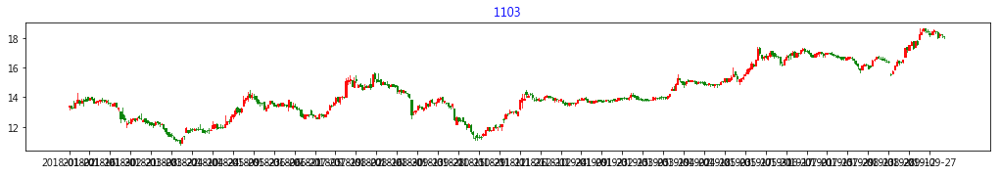

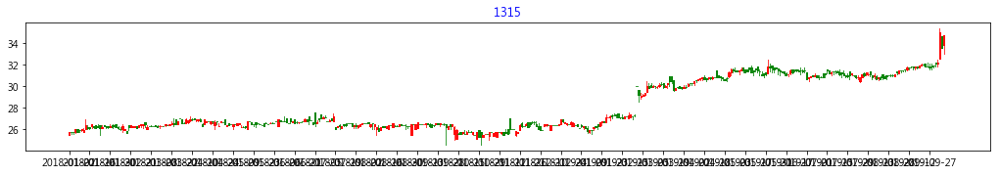

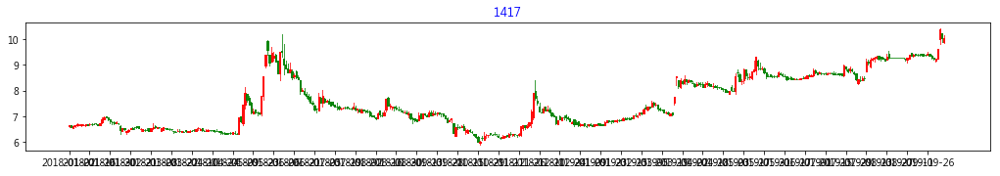

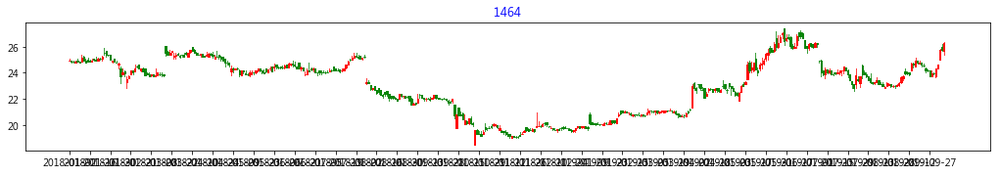

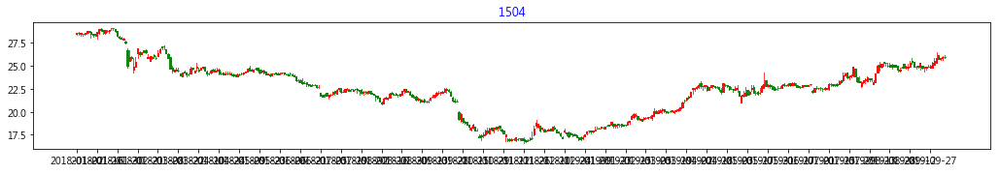

...

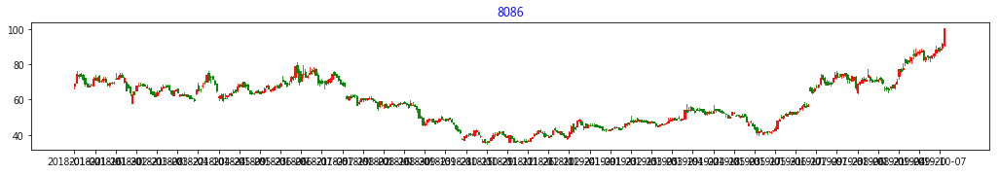

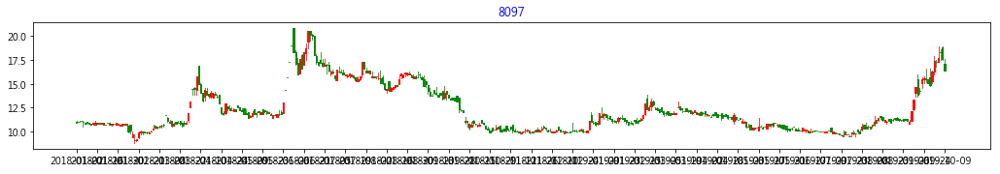

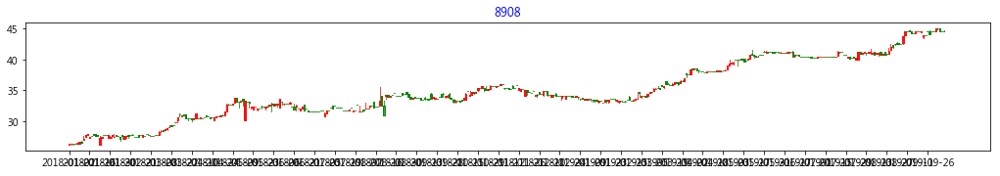

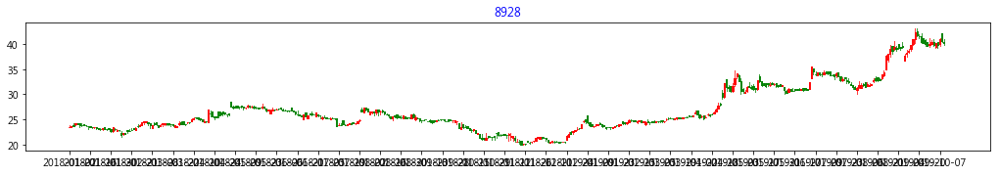

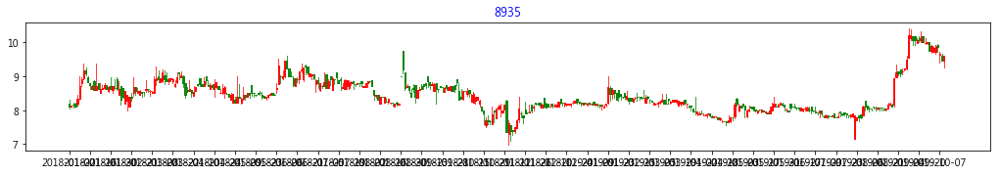

In [46]:
# How to display multiple images in one figure
columns = 3

'''
Syntax:
import math
math.floor(x)
Parameter: 
x-numeric expression. 
Returns: 
largest integer not greater than x.

e.g. 300.5 => 300.0

Syntax: 
import math
math.ceil(x)
Parameter:
x:This is a numeric expression.
Returns: 
Smallest integer not less than x.

e.g. 300.5 => 301.0
'''
import math
rows = math.ceil(len(list_matchCriteria)/columns)

'''
https://stackoverflow.com/questions/43326680/what-are-the-differences-between-add-axes-and-add-subplot

Both, add_axes and add_subplot add an axes to a figure. They both return a (subclass of a) matplotlib.axes.Axes object.
However, the mechanism which is used to add the axes differs substantially.

add_axes
The calling signature of add_axes is add_axes(rect), where rect is a list [x0, y0, width, height] denoting the lower left point of the new axes in figure coodinates (x0,y0) and its width and height. So the axes is positionned in absolute coordinates on the canvas. E.g.

fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
places a figure in the canvas that is exactly as large as the canvas itself.

add_subplot
The calling signature of add_subplot does not directly provide the option to place the axes at a predefined position. It rather allows to specify where the axes should be situated according to a subplot grid. The usual and easiest way to specify this position is the 3 integer notation,

fig = plt.figure()
ax = fig.add_subplot(231)
In this example a new axes is created at the first position (1) on a grid of 2 rows and 3 columns. To produce only a single axes, add_subplot(111) would be used (First plot on a 1 by 1 subplot grid). (In newer matplotlib versions, add_subplot()` without any arguments is possible as well.)
'''
from pandas_datareader._utils import RemoteDataError

#Warning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory.
#use the following setup:
plt.rcParams.update({'figure.max_open_warning': 0})

startYear=2018
startMonth=1
startDate=1
for index in range(len(list_matchCriteria)):
    try:
        df = crawl_price(list_matchCriteria[index], startYear, startMonth, startDate)
        '''
        figsize : (float, float), optional, default: None
        width, height in inches. If not provided, defaults to rcParams["figure.figsize"] = [6.4, 4.8] = [6.4, 4.8].
        '''
        fig = plt.figure(figsize=(60, 150))
        #ax = fig.add_subplot(1, 1, 1)
        
        #Error: num must be 1 <= num <= 126, not 0, so index should plus 1, 126 is rows * columns
        ax = fig.add_subplot(rows, columns, index+1) #add one axes in figure
        ax.set_xticks(range(0, len(df.index), 10))
        ax.set_xticklabels(df.index[::10])
        ax.set_title(list_matchCriteria[index],fontsize=12,color='b')
        mpf.candlestick2_ochl(ax, df['Open'], df['Close'], df['High'],
                              df['Low'], width=0.6, colorup='r', colordown='g', alpha=0.75); 
        
        print("Completed drawing chart of '%s'" % list_matchCriteria[index]),
        print(",'%s of %s'" % (index+1, len(list_matchCriteria)))
    except (RemoteDataError, ValueError) as error:
        print("Error of '%s'" % list_matchCriteria[index])
        print('Error: {0}'.format(error))
        continue
plt.show()

In [41]:
sma_5

array([        nan,         nan,         nan,         nan, 11.72999992,
       11.73999996, 11.75      , 11.76000004, 11.75      , 11.75      ,
       11.75      , 11.76000004, 11.77000008, 11.78000011, 11.78000011,
       11.60000019, 11.41000023, 11.22000027, 11.02000027, 10.81000023,
       10.77000008, 10.72999992, 10.67999992, 10.61999989, 10.56999989,
       10.56000004, 10.56000004, 10.56000004, 10.58000011, 10.59000015,
       10.58000011, 10.56000023, 10.54000015, 10.52000008, 10.52000008,
       10.5       , 10.5       , 10.47999992, 10.45999985, 10.44999981,
       10.46999989, 10.46999989, 10.51000004, 10.55000019, 10.56000023,
       10.55000019, 10.54000015, 10.53000011, 10.51000004, 10.51000004,
       10.5       , 10.47999992, 10.46999989, 10.46999989, 10.47999992,
       10.5       , 10.6       , 10.67999992, 10.75999985, 10.82999973,
       10.87999973, 10.85999985, 10.82999992, 10.8       , 10.78000011,
       10.77000008, 10.76000004, 10.76000004, 10.75      , 10.71

In [42]:
np.array(df[['Close']])

array([[11.69999981],
       [11.69999981],
       [11.69999981],
       [11.80000019],
       [11.75      ],
       [11.75      ],
       [11.75      ],
       [11.75      ],
       [11.75      ],
       [11.75      ],
       [11.75      ],
       [11.80000019],
       [11.80000019],
       [11.80000019],
       [11.75      ],
       [10.85000038],
       [10.85000038],
       [10.85000038],
       [10.80000019],
       [10.69999981],
       [10.64999962],
       [10.64999962],
       [10.60000038],
       [10.5       ],
       [10.44999981],
       [10.60000038],
       [10.64999962],
       [10.60000038],
       [10.60000038],
       [10.5       ],
       [10.55000019],
       [10.55000019],
       [10.5       ],
       [10.5       ],
       [10.5       ],
       [10.44999981],
       [10.55000019],
       [10.39999962],
       [10.39999962],
       [10.44999981],
       [10.55000019],
       [10.55000019],
       [10.60000038],
       [10.60000038],
       [10.5       ],
       [10

In [43]:
np.array(df['Close'])

array([11.69999981, 11.69999981, 11.69999981, 11.80000019, 11.75      ,
       11.75      , 11.75      , 11.75      , 11.75      , 11.75      ,
       11.75      , 11.80000019, 11.80000019, 11.80000019, 11.75      ,
       10.85000038, 10.85000038, 10.85000038, 10.80000019, 10.69999981,
       10.64999962, 10.64999962, 10.60000038, 10.5       , 10.44999981,
       10.60000038, 10.64999962, 10.60000038, 10.60000038, 10.5       ,
       10.55000019, 10.55000019, 10.5       , 10.5       , 10.5       ,
       10.44999981, 10.55000019, 10.39999962, 10.39999962, 10.44999981,
       10.55000019, 10.55000019, 10.60000038, 10.60000038, 10.5       ,
       10.5       , 10.5       , 10.55000019, 10.5       , 10.5       ,
       10.44999981, 10.39999962, 10.5       , 10.5       , 10.55000019,
       10.55000019, 10.89999962, 10.89999962, 10.89999962, 10.89999962,
       10.80000019, 10.80000019, 10.75      , 10.75      , 10.80000019,
       10.75      , 10.75      , 10.75      , 10.69999981, 10.60